# <img src="https://img.icons8.com/bubbles/100/000000/3d-glasses.png" style="height:50px;display:inline"> EE 046746 - Technion - Computer Vision


## Homework 2 - Features Descriptors
---

### <img src="https://img.icons8.com/dusk/64/000000/python.png" style="height:50px;display:inline"> Python Libraries
---

* `numpy`
* `matplotlib`
* `opencv` (or `scikit-image`)
* `scikit-learn`
* `scipy`
* Anything else you need (`os`, `pandas`, `csv`, `json`,...)

### <img src="https://img.icons8.com/bubbles/50/000000/checklist.png" style="height:50px;display:inline"> Tasks
---
* In all tasks, you should document your process and results in a report file (which will be saved as `.pdf`). 
* You can reference your code in the report file, but no need for actual code in this file, the code is submitted in a seprate folder as explained above.

#### Introduction 
---
In this homework, we will implement an interest point (keypoint) detector similar to SIFT. Then, we will describe the region around each keypoint using a feature descriptor.
In class, we have seen the SIFT keypoint extraction and description extraction. In this HW, we will implement the BRIEF, which is another commonly used feature descriptor.
The BRIEF is more compact and quicker, which allows real-time computation. Additionally, its performance is powerful just as more complex descriptors like SIFT for many cases.

In [1]:
# imports for hw1 (you can add any other library as well)
import numpy as np
import matplotlib.pyplot as plt
import cv2
from typing import List, Tuple, Iterable, Union, Sequence
%matplotlib inline

#### Part 1 - Keypoint Detector
---
The first part will include implementing an interest point detector, similar to SIFT. Additional details for the chosen implementation can be found in <a href="https://people.eecs.berkeley.edu/~malik/cs294/lowe-ijcv04.pdf">[2]</a>. 
In order to find keypoints, we will use the Difference of Gaussian (DoG) detector <a href="https://ieeexplore.ieee.org/stamp/stamp.jsp?tp=&arnumber=1095851">[1]</a>. We will use a simplified version of (DoG) as described in section 3 of <a href="https://people.eecs.berkeley.edu/~malik/cs294/lowe-ijcv04.pdf">[2]</a>. 

NOTE: The parameters to use for the following sections are:
$$\sigma_0 = 1, k =\sqrt 2, levels = [-1; 0; 1; 2; 3; 4], \theta_c = 0.03 \text{ and } \theta_r = 12$$



##### 1.1 Load Image
Load the `model_chickenbroth.jpg` image and show it:

<class 'numpy.ndarray'>


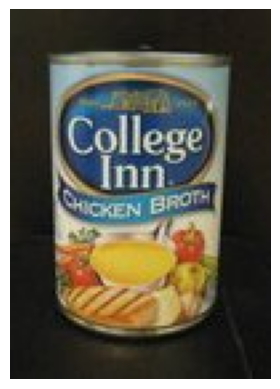

In [2]:
im = cv2.imread('data/model_chickenbroth.jpg')
print(type(im))
plt.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB))
_ = plt.axis('off')

74.61305241521069
0.29260020554984584


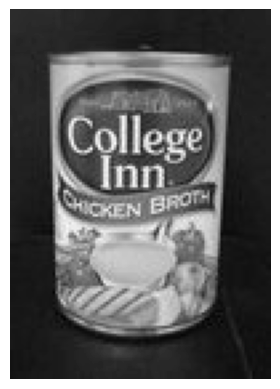

In [3]:
# or in grayscale:
im = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
print(im.mean())
im = im / 255
print(im.mean())
plt.imshow(im, cmap='gray')
_ = plt.axis('off')

In [6]:
def load_image_as_grayscale(image_path: str, normalize: bool = True) -> np.ndarray:
    im = cv2.imread(image_path)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
    # print(im.mean())
    if normalize:
        im = im / 255 # for feature extraction
    # print(im.mean())
    return im

##### 1.2 Gaussian Pyramid
Before we construct a DoG pyramid, we need to construct a Gaussian Pyramid by progressively applying a low pass Gaussian filter to the input image.
We provide you the following function `createGaussianPyramid` which gets a grayscale image with values between 0 to 1 (hint: normalize your input image and convert to grayscale). This function outputs GaussianPyramid matrix, which is a set of $L=len(levels)$ blurred images.

What is the shape of GaussianPyramid matrix?

In [9]:
def createGaussianPyramid(im: np.ndarray, sigma0: float = 1, k: float = np.sqrt(2),
                          levels: List[int] = [-1, 0, 1, 2, 3, 4]) -> np.ndarray:
    """Returns an np.`ndarray` of `len(levels)` progressively more blurred images."""
    GaussianPyramid = []
    for i in range(len(levels)):
        sigma_ = sigma0 * k ** levels[i]
        size = int(np.floor( 3 * sigma_ * 2) + 1)
        blur = cv2.GaussianBlur(im,(size,size),sigma_)
        GaussianPyramid.append(blur)
    return np.stack(GaussianPyramid)

Use the following function to visualize your pyramid. 
* Add the results to your PDF report.

In [10]:
def displayPyramid(pyramid: Union[Sequence[np.ndarray], np.ndarray], color: bool = False):

    if type(pyramid) == list:
        pyramid = np.stack(pyramid)

    plt.figure(figsize=(16,5))
    if color:
        plt.imshow(np.hstack(pyramid))
    else:
        plt.imshow(np.hstack(pyramid), cmap='gray')
    plt.axis('off')

Short example of using the above functions:

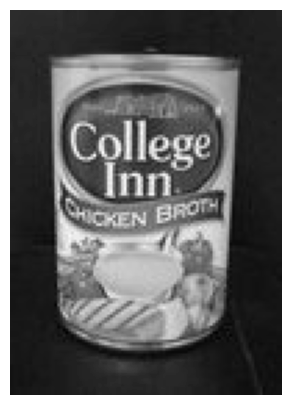

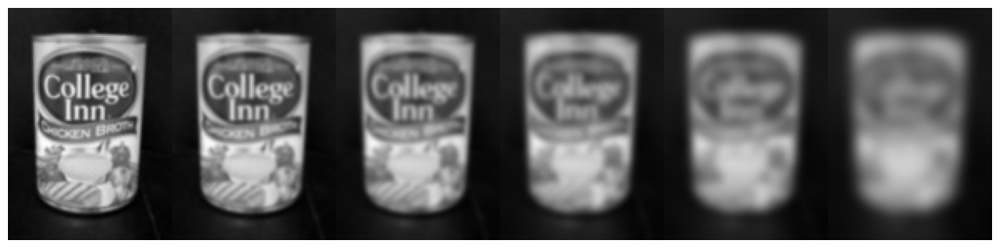

In [11]:
# example:
im = load_image_as_grayscale('data/model_chickenbroth.jpg')
displayPyramid([im])
sigma0 = 1
k = np.sqrt(2)
levels = [-1, 0, 1, 2, 3, 4]
GaussianPyramid = createGaussianPyramid(im, sigma0, k, levels) 
displayPyramid(GaussianPyramid)

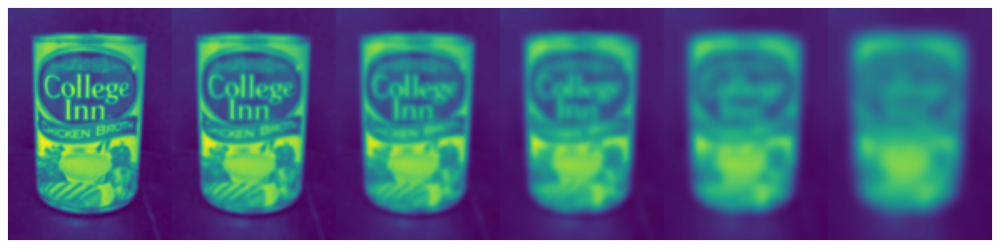

In [17]:
displayPyramid(GaussianPyramid, color=True)

In [12]:
# get the shape of GaussianPyramid matrix
GaussianPyramid.shape

(6, 139, 98)

##### 1.3 The DoG Pyramid
In this section we will construct the DoG pyramid. Each level of the DoG is constructed by substructing two levels of the Gaussian pyramid:

$$D_l(x,y,\sigma_l) = (G(x,y,\sigma_{l-1})-G(x,y,\sigma_l))*I(x,y)$$

Where $G(x,y,\sigma_l)$ is the Gaussian filter used at level $l$ in the Gaussian pyramid, $I(x,y)$ is the original image, and $*$ is the *convolution* operator.

We can simplify the equation due to the distributive property of convolution:

$$D_l(x,y,\sigma_l) = G(x,y,\sigma_{l-1})*I(x,y)-G(x,y,\sigma_l)*I(x,y)=GP_{l-1}-GP_{l}$$

Where $GP_l$ is the level $l$ in the Gaussian pyramid.

<img src="./assets/Gaussian_DoG_pyramid.PNG" width="400">

* Write the following function to constract a DoG pyramid:

In [13]:
def createDoGPyramid(GaussianPyramid: Union[Sequence[np.ndarray], np.ndarray],
                     levels: List[int] = [-1, 0, 1, 2, 3, 4]) -> Tuple[List[np.ndarray], List[int]]:
    """Produces DoG Pyramid
    inputs
    GaussianPyramid - A matrix of grayscale images of size
                       (len(levels), shape(im))
    levels          - the levels of the pyramid where the blur at each level is
                      outputs
    DoGPyramid      - size (len(levels) - 1, shape(im)) matrix of the DoG pyramid
                      created by differencing the Gaussian Pyramid input
    DogLevels       - the levels of the pyramid where the blur at each level corresponds
                      to the DoG scale"""
    DoGPyramid = []
    DoGLevels = []
    for i in range(len(levels)-1):
        DoGPyramid.append(GaussianPyramid[i]-GaussianPyramid[i+1])
        DoGLevels.append(levels[i] - levels[i+1]) # TODO validate
    return DoGPyramid, DoGLevels

Note how the DoG Pyramid highlights areas of high pixel value variance and reduces contrast for homogeneous areas

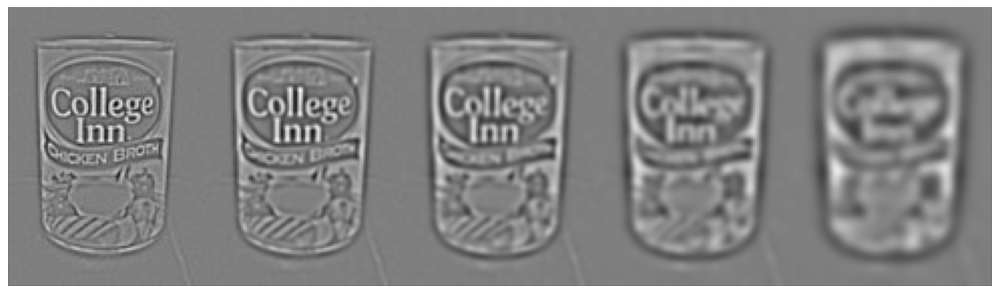

In [14]:
# display the DOG pyramid
DoGPyramid, DoGLevels = createDoGPyramid(GaussianPyramid, levels)
displayPyramid(DoGPyramid)

This function should return DoGPyramid an $(L-1)\times imH \times imW$ matrix, where $imH\times imW$ is the original image resolution.

##### 1.4 Edge Suppression
The Difference of Gaussian function responds strongly on corners and edges in addition to blob-like objects. However, edges are not desirable for feature extraction as they are not as distinctive and do not provide a substantially stable localization for keypoints.

Here, we will implement the edge removal method described in Section 4.1 of <a href="https://people.eecs.berkeley.edu/~malik/cs294/lowe-ijcv04.pdf">[2]</a>, which is based on the principal curvature ratio in a local neighborhood of a point. The paper presents the observation that edge points will have a "large principal curvature across
the edge but a small one in the perpendicular direction."


* Implement the following function:

In [15]:
def computePrincipalCurvature(DoGPyramid: Union[Sequence[np.ndarray], np.ndarray]) -> List[np.ndarray]:
    """Edge Suppression
     Takes in DoGPyramid generated in createDoGPyramid and returns
     PrincipalCurvature,a matrix of the same size where each point contains the
     curvature ratio R for the corre-sponding point in the DoG pyramid
    
     INPUTS
     DoG Pyramid - size (len(levels) - 1, shape(im)) matrix of the DoG pyramid
    
     OUTPUTS
     PrincipalCurvature - size (len(levels) - 1, shape(im)) matrix where each 
                          point contains the curvature ratio R for the 
                          corresponding point in the DoG pyramid"""
    
    PrincipalCurvature = []

    for dog in DoGPyramid:
        
        dx = cv2.Sobel(dog, cv2.CV_64F, 1, 0, ksize=3)
        dy = cv2.Sobel(dog, cv2.CV_64F, 0, 1, ksize=3)
        dxx = cv2.Sobel(dx, cv2.CV_64F, 1, 0, ksize=3)
        dyy = cv2.Sobel(dy, cv2.CV_64F, 0, 1, ksize=3)
        dxy = cv2.Sobel(dx, cv2.CV_64F, 0, 1, ksize=3)

        non_negative_matrix =  (dxx + dyy)**2 / (dxx * dyy - dxy**2 + 1e-8)
        non_negative_matrix = np.maximum(non_negative_matrix, 0)
        PrincipalCurvature.append(non_negative_matrix)
    
    return PrincipalCurvature

The function takes in DoGPyramid generated in the previous section and returns PrincipalCurvature, a matrix of the same size where each point contains the curvature ratio R for the corresponding point in the DoG pyramid:

$ R = \frac{TR(H)^2}{Det(H)} = \frac{(\lambda_{min}+\lambda_{max})^2}{\lambda_{min}\lambda_{max}}$

where H is the Hessian of the Difference of Gaussian function (i.e. one level of the DoG pyramid) computed by using pixel differences as mentioned in Section 4.1 of [2]. **Use the Sobel filter to  compute the second order derivatives** (hint: `cv2.Sobel()`).

$ H = \begin{bmatrix}
D_{xx} & D_{xy}\\
D_{yx} & D_{yy}
\end{bmatrix}$

This is similar in spirit to but different than the Harris corner detection matrix you saw in class. Both methods examine the eigenvalues $\lambda$ of a matrix, but the method in <a href="https://people.eecs.berkeley.edu/~malik/cs294/lowe-ijcv04.pdf">[2]</a> performs a test without requiring the direct computation of the eigenvalues. Note that you need to compute each term of the Hessian before being able to take the trace and
determinant. Feel free to implement the mathemtical formulas of $TR(H)$ and $Det(H)$ directly without explicitly building $H$. In addition, to avoid division by zero, please add a safeguard $\epsilon=10^{-8}$ to the denominator of $R$.

We can see that $R$ reaches its minimum when the two eigenvalues $\lambda_{min}$ and $\lambda_{max}$ are equal, meaning that the curvature is the same in the two principal directions. Edge points, in general, will have a principal curvature significantly larger in one direction than the other. To remove edge points, we simply check against a threshold $R > \theta_r$. In addition, in the unlikely event of a negative determinant we also discard points for which $R < 0$.
<!-- Fig. 3 shows t
he DoG detector with and without edge suppression. -->

##### 1.5 Detecting Extrema
To detect corner-like, scale-invariant interest points, the DoG detector chooses points that are local extrema in both scale and space. Here, we will consider a point’s eight neighbors in space and its two neighbors in scale (one in the scale above and one in the scale below).

<img src="./assets/DoG_neighbors_10.png" width="200">

* write the function:

In [16]:
def is_local_extremum(DoGPyramid: np.ndarray, x: int, y: int, i: int , shape_size: Tuple[int, int] = (256, 256)) -> bool:
    """Returns a boolean for whether the pixel at hand is a local extremum relative to up to 10 bordering pixels:
    up to 8 bordering pixels in the same level of the pyramid and 2 adjacent pixels in the level above and below."""
    neighbors_list = []
    if i > 0:
        neighbors_list.append(DoGPyramid[i-1, y, x])
    if i < DoGPyramid.shape[0]-1:
        neighbors_list.append(DoGPyramid[i+1, y, x])
    if x > 0:
        neighbors_list.append(DoGPyramid[i, y, x-1])
    if x < shape_size[1]-1:
        neighbors_list.append(DoGPyramid[i, y, x+1])
    if y > 0:
        neighbors_list.append(DoGPyramid[i, y-1, x])
    if y < shape_size[0]-1:
        neighbors_list.append(DoGPyramid[i, y+1, x])
    if y > 0 and x > 0:
        neighbors_list.append(DoGPyramid[i, y-1, x-1])
    if y > 0 and x < shape_size[1]-1:
        neighbors_list.append(DoGPyramid[i, y-1, x+1])
    if y < shape_size[0]-1 and x > 0:
        neighbors_list.append(DoGPyramid[i, y+1, x-1])
    if y < (shape_size[0]-1) and x < (shape_size[1]-1):
        neighbors_list.append(DoGPyramid[i, y+1, x+1])

    return DoGPyramid[i, y, x] > max(neighbors_list) or DoGPyramid[i, y, x] < min(neighbors_list)


def getLocalExtrema(DoGPyramid: Union[Sequence[np.ndarray], np.ndarray], DoGLevels: List[int], PrincipalCurvature: List[np.ndarray], 
                    th_contrast: float = 0.03, th_r: float = 12): 
    """Returns local extrema points in both scale and space using the DoGPyramid
    INPUTS
          DoGPyramid         - size (len(levels) - 1, imH, imW ) matrix of the DoG pyramid
          DoGlevels          - The levels of the pyramid where the blur at each level is
                               outputs
          PrincipalCurvature - size (len(levels) - 1, imH, imW) matrix contains the
                               curvature ratio R
          th_contrast        - remove any point that is a local extremum but does not have a
                               DoG response magnitude above this threshold
          th_r               - remove any edge-like points that have too large a principal
                               curvature ratio
    OUTPUTS
          locsDoG            - N x 3 matrix where the DoG pyramid achieves a local extrema in both
                               scale and space, and also satisfies the two thresholds.
    """
    
    locsDoG = []
    DoGPyramid = np.array(DoGPyramid)
    
    for i in range(len(DoGPyramid)):
        for y in range(DoGPyramid.shape[1]):
            for x in range(DoGPyramid.shape[2]):
                if is_local_extremum(DoGPyramid, x, y, i, shape_size=DoGPyramid.shape[1:]):
                    if np.abs(DoGPyramid[i, y, x]) > th_contrast and 0 <  PrincipalCurvature[i][y, x] < th_r:
                        locsDoG.append([x, y, i])
    return locsDoG


This function takes as input `DoGPyramid` and `DoGLevels` from Section 1.3 and `PrincipalCurvature` from Section 1.4. It also takes two threshold values, `th_contrast` and `th_r`. The threshold $\theta_c$ should remove any point that is a local extremum but does not have a Difference
of Gaussian (DoG) response magnitude above this threshold (i.e. $|D(x, y, \sigma)| > \theta_c$). The threshold $\theta_r$ should remove any edge-like points that have too large a principal curvature ratio specified by `PrincipalCurvature`.

The function should return `locsDoG`, a $N \times 3$ matrix ($N$ is the number of the detected extrema points) where the DoG pyramid achieves a local extrema in both scale and space, and also satisfies the two thresholds. The first and second column of `locsDoG` should be the $(x, y)$ values of the local extremum and the third column should contain the corresponding level of the DoG pyramid where it was detected (try to eliminate loops in the function so that it runs efficiently).

**NOTE**: In all implementations, we assume the $x$ coordinate corresponds to
columns and $y$ coordinate corresponds to rows. For example, the coordinate
$(10, 20)$ corresponds to the (row 20, column 10) in the image.




##### 1.6 Putting it Together
* Write the following function to combine the above parts into a DoG detector:

In [18]:
def DoGdetector(im: np.ndarray, sigma0: float = 1, k: float = np.sqrt(2),
                levels: List[int] = [-1, 0, 1, 2, 3, 4], th_contrast: float = 0.03, th_r: float = 12) -> Tuple[np.ndarray, np.ndarray]:
    """Putting it all together
    Inputs          Description
    --------------------------------------------------------------------------
    im              Grayscale image with range [0,1].
    sigma0          Scale of the 0th image pyramid.
    k               Pyramid Factor.  Suggest sqrt(2).
    levels          Levels of pyramid to construct. Suggest -1:4.
    th_contrast     DoG contrast threshold.  Suggest 0.03.
    th_r            Principal Ratio threshold.  Suggest 12.
    Outputs         Description
    --------------------------------------------------------------------------
    locsDoG         N x 3 matrix where the DoG pyramid achieves a local extrema
                    in both scale and space, and satisfies the two thresholds.
    gauss_pyramid   A matrix of grayscale images of size (len(levels),imH,imW)"""
    
    gauss_pyramid = createGaussianPyramid(im, sigma0, k, levels)
    DoGPyramid, DoGLevels = createDoGPyramid(gauss_pyramid, levels)
    PrincipalCurvature = computePrincipalCurvature(DoGPyramid)
    locsDoG = getLocalExtrema(DoGPyramid, DoGLevels, PrincipalCurvature, th_contrast, th_r)
    
    return locsDoG, gauss_pyramid

The function should take in a grayscale image, `im`, scaled between 0 and 1, and the parameters `sigma0, k, levels, th_contrast`, and `th_r`. It should use each of the above functions and return the keypoints in `locsDoG` and the Gaussian pyramid in `GaussianPyramid`.
Note that we are dealing with real images here, so your keypoint detector may find points with high scores that you do not perceive to be corners.

* For sanity check, use the provided image `sanitycheck.jpg`. Since this image contains only simple geometrical shapes, the detection result should be a perfect detection of all corners:

<img src="./assets/sanitycheck_detections2.png" width="400">

* Include another real image with the detected keypoints in your PDF report. You can use any of the real provided images.
* Take a step outside, take a picture, and apply your keypoints detector. Do you get reasonable results? How can you improve the results? Add the result and discussion to your report.

In [32]:
def detect_and_visualize_keypoints(image_path: str, name: str = '', sigma0: float = 1, k: float = np.sqrt(2), 
                                   levels: list = [-1, 0, 1, 2, 3, 4], th_contrast: float = 0.03, th_r: float = 12) -> np.ndarray:
    # Read and preprocess the image
    im = cv2.imread(image_path)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
    im = im / 255.0

    # Detect keypoints
    locsDoG, gauss_pyramid = DoGdetector(im, sigma0, k, levels=levels, th_contrast=th_contrast, th_r=th_r) # im, sigma0, k, levels, th_contrast, th_r)

    # Visualize the keypoints
    locsDoG = np.array(locsDoG)
    plt.figure()
    plt.imshow(im, cmap='gray')
    plt.plot(locsDoG[:, 0], locsDoG[:, 1], 'r.')
    plt.axis('off')
    if name:
        plt.savefig('output/'+name+'_th_contrast_'+str(th_contrast)+'_th_curvature_'+str(th_r)+'.png')
    plt.show()

    return locsDoG

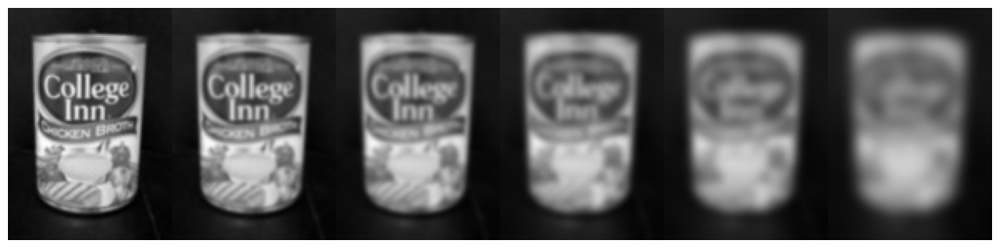

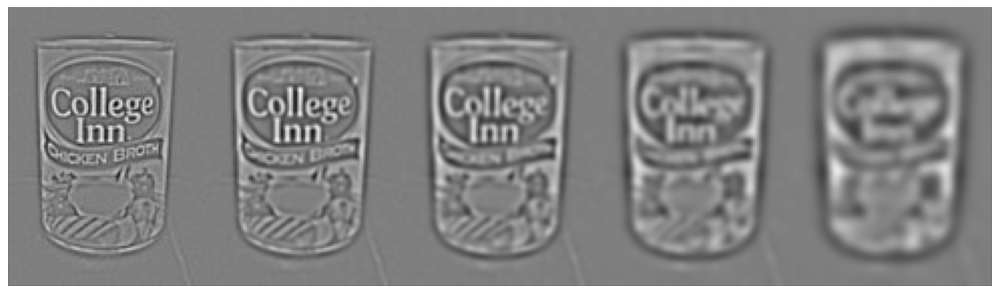

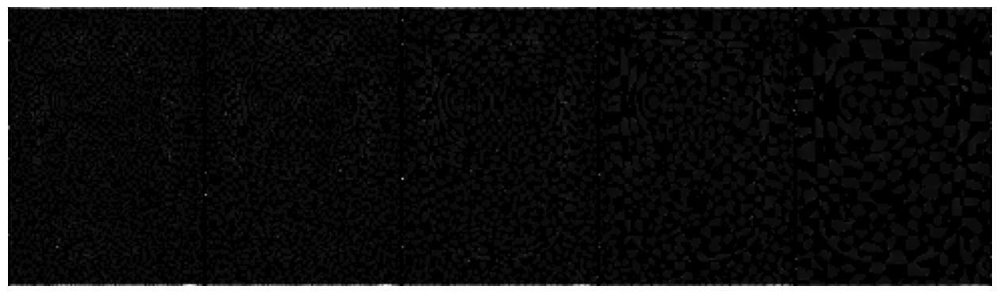

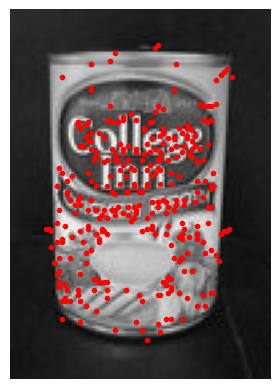

[[ 39  16   0]
 [ 30  20   0]
 [ 81  22   0]
 [ 30  29   0]
 [ 37  36   0]
 [ 55  36   0]
 [ 74  36   0]
 [ 57  37   0]
 [ 54  38   0]
 [ 42  40   0]
 [ 25  42   0]
 [ 29  42   0]
 [ 40  42   0]
 [ 28  43   0]
 [ 63  44   0]
 [ 67  44   0]
 [ 68  45   0]
 [ 33  46   0]
 [ 57  46   0]
 [ 64  46   0]
 [ 56  47   0]
 [ 66  47   0]
 [ 69  47   0]
 [ 53  48   0]
 [ 59  48   0]
 [ 61  48   0]
 [ 57  50   0]
 [ 26  51   0]
 [ 44  51   0]
 [ 69  51   0]
 [ 30  52   0]
 [ 38  52   0]
 [ 54  52   0]
 [ 60  52   0]
 [ 68  52   0]
 [ 71  52   0]
 [ 32  53   0]
 [ 42  53   0]
 [ 47  53   0]
 [ 52  53   0]
 [ 56  53   0]
 [ 64  53   0]
 [ 56  55   0]
 [ 62  55   0]
 [ 59  56   0]
 [ 42  58   0]
 [ 52  58   0]
 [ 45  59   0]
 [ 55  59   0]
 [ 54  61   0]
 [ 23  62   0]
 [ 21  64   0]
 [ 73  64   0]
 [ 60  65   0]
 [ 46  66   0]
 [ 51  66   0]
 [ 76  66   0]
 [ 21  68   0]
 [ 49  68   0]
 [ 70  68   0]
 [ 72  70   0]
 [ 22  71   0]
 [ 25  71   0]
 [ 30  71   0]
 [ 57  71   0]
 [ 65  71   0]
 [ 53  72 

In [140]:
# A full run:
im = load_image_as_grayscale('data/model_chickenbroth.jpg')
gausspyr = createGaussianPyramid(im)
displayPyramid(gausspyr)
dogpyr, doglevels = createDoGPyramid(gausspyr)
displayPyramid(dogpyr)
princcur = computePrincipalCurvature(dogpyr)
displayPyramid([p ** (1/5) / 10 for p in princcur], color=False)
extrema = getLocalExtrema(dogpyr, doglevels, princcur)
keypoints = detect_and_visualize_keypoints('data/model_chickenbroth.jpg', 'chicken_broth_keypoints')
print(keypoints)
print(type(keypoints))

Some extra trial and error - visualizations of different parameters

In [34]:
def DoGdetector_loop(im: np.ndarray, sigma0: float, k: float, levels: list,
                     th_contrasts: List[float] = [0.03], th_rs: List[float] = [12]) -> List[np.ndarray]:
    """Try all combinations in the Cartesian product of th_contrasts and th_rs."""
    
    gauss_pyramid = createGaussianPyramid(im, sigma0, k, levels)
    DoGPyramid, DoGLevels = createDoGPyramid(gauss_pyramid, levels)
    PrincipalCurvature = computePrincipalCurvature(DoGPyramid)
    locsDoGs = []
    for th_contrast in th_contrasts:
        for th_r in th_rs:
            locsDoG = getLocalExtrema(DoGPyramid, DoGLevels, PrincipalCurvature, th_contrast, th_r)
            locsDoGs.append(locsDoG)
    
    return locsDoGs

In [54]:
gauss_pyramid = createGaussianPyramid(im, sigma0, k, levels)

In [41]:
keypoints = DoGdetector(im, 1, np.sqrt(2), [-1, 0, 1, 2, 3, 4])
print(keypoints)
print(type(keypoints))

([[39, 16, 0], [30, 20, 0], [81, 22, 0], [30, 29, 0], [37, 36, 0], [55, 36, 0], [74, 36, 0], [57, 37, 0], [54, 38, 0], [42, 40, 0], [25, 42, 0], [29, 42, 0], [40, 42, 0], [28, 43, 0], [63, 44, 0], [67, 44, 0], [68, 45, 0], [33, 46, 0], [57, 46, 0], [64, 46, 0], [56, 47, 0], [66, 47, 0], [69, 47, 0], [53, 48, 0], [59, 48, 0], [61, 48, 0], [57, 50, 0], [26, 51, 0], [44, 51, 0], [69, 51, 0], [30, 52, 0], [38, 52, 0], [54, 52, 0], [60, 52, 0], [68, 52, 0], [71, 52, 0], [32, 53, 0], [42, 53, 0], [47, 53, 0], [52, 53, 0], [56, 53, 0], [64, 53, 0], [56, 55, 0], [62, 55, 0], [59, 56, 0], [42, 58, 0], [52, 58, 0], [45, 59, 0], [55, 59, 0], [54, 61, 0], [23, 62, 0], [21, 64, 0], [73, 64, 0], [60, 65, 0], [46, 66, 0], [51, 66, 0], [76, 66, 0], [21, 68, 0], [49, 68, 0], [70, 68, 0], [72, 70, 0], [22, 71, 0], [25, 71, 0], [30, 71, 0], [57, 71, 0], [65, 71, 0], [53, 72, 0], [55, 72, 0], [58, 72, 0], [69, 72, 0], [24, 73, 0], [26, 73, 0], [48, 73, 0], [62, 73, 0], [65, 73, 0], [44, 74, 0], [55, 74, 0

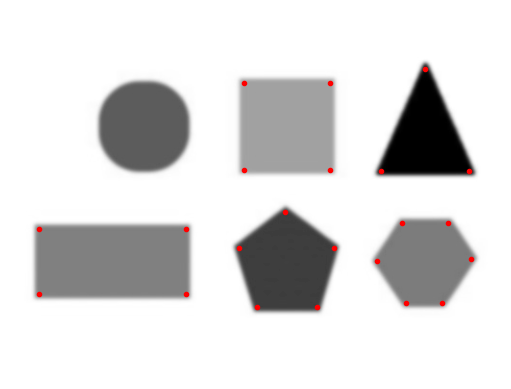

In [38]:
sigma0 = 1
k = np.sqrt(2)
im_path = 'data/sanitycheck.jpg'
# keypoints = detect_and_visualize_keypoints(im_path, '1.8.24_sanity_check', sigma0, k, levels=[-1, 0, 1, 2, 3, 4], th_contrast=0.03, th_r=12)

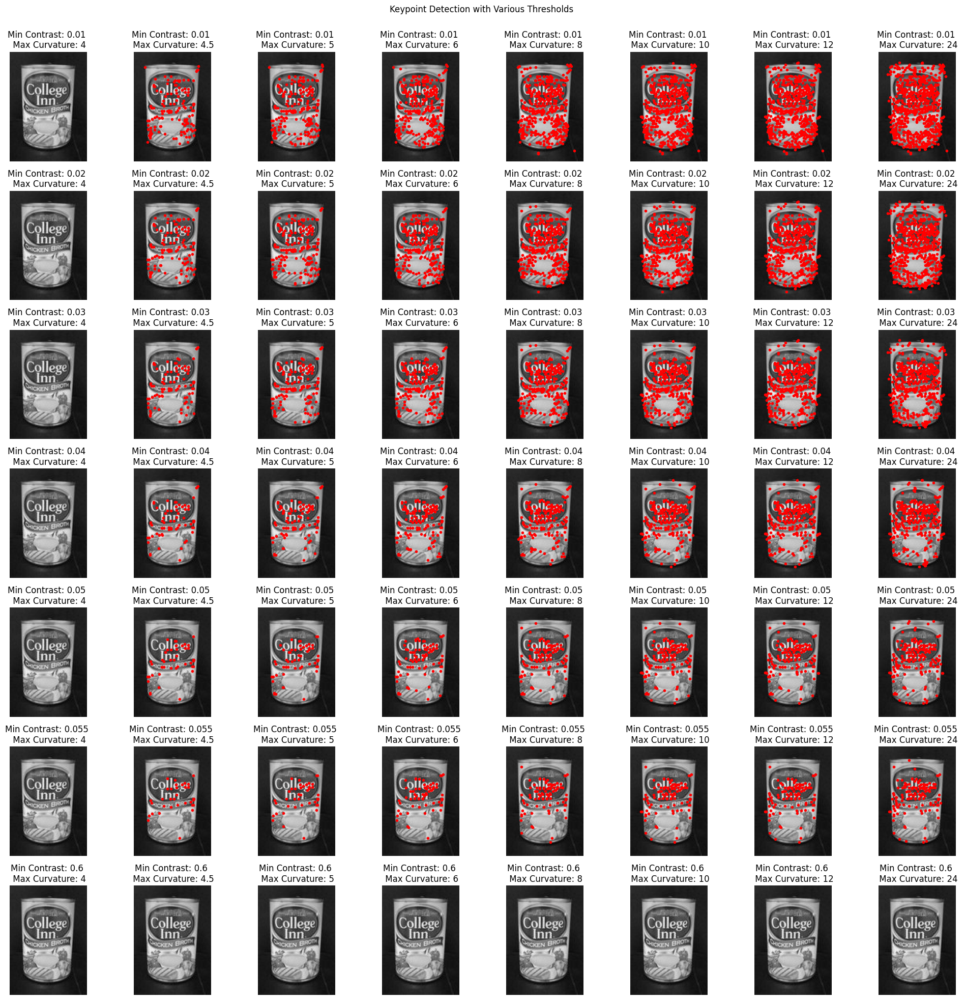

In [51]:
# Define more thresholds for contrast and principal curvature ratio
th_contrasts = [0.01, 0.02, 0.03, 0.04, 0.05, 0.055, 0.6]
th_rs = [4, 4.5, 5, 6, 8, 10, 12, 24]

# Create a 3x3 grid of subplots
fig, axes = plt.subplots(nrows=len(th_contrasts), ncols=len(th_rs), figsize=(20, 20))
fig.suptitle('Keypoint Detection with Various Thresholds \n\n')

# Iterate over each combination of thresholds
for i, th_contrast in enumerate(th_contrasts):
    for j, th_r in enumerate(th_rs):
        # Detect keypoints with current thresholds
        locsDoGs = DoGdetector_loop(im, sigma0, k, levels, th_contrasts=[th_contrast], th_rs=[th_r]) # ended up not using the built in loop
        locsDoG = np.array(locsDoGs[0]) 
        
        # Plot keypoints on the corresponding subplot
        ax = axes[i, j]
        ax.imshow(im, cmap='gray')
        if len(locsDoG) > 0:
            ax.plot(locsDoG[:, 0], locsDoG[:, 1], 'r.')
        ax.axis('off')
        ax.set_title(f'Min Contrast: {th_contrast} \n Max Curvature: {th_r}')

# Adjust layout
plt.tight_layout()
plt.show()

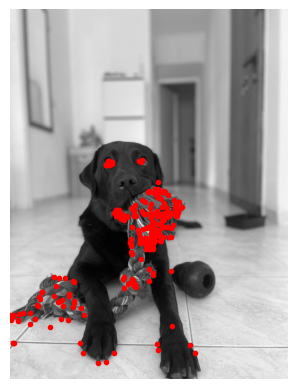

array([[ 569,  653,    0],
       [ 422,  656,    0],
       [ 556,  656,    0],
       [ 440,  661,    0],
       [ 443,  666,    0],
       [ 440,  669,    0],
       [ 436,  670,    0],
       [ 428,  674,    0],
       [ 639,  776,    0],
       [ 664,  786,    0],
       [ 662,  789,    0],
       [ 666,  789,    0],
       [ 669,  789,    0],
       [ 621,  792,    0],
       [ 642,  792,    0],
       [ 640,  794,    0],
       [ 622,  795,    0],
       [ 685,  802,    0],
       [ 647,  818,    0],
       [ 654,  819,    0],
       [ 571,  824,    0],
       [ 709,  824,    0],
       [ 731,  832,    0],
       [ 584,  834,    0],
       [ 612,  843,    0],
       [ 713,  845,    0],
       [ 528,  858,    0],
       [ 737,  858,    0],
       [ 679,  861,    0],
       [ 726,  861,    0],
       [ 725,  863,    0],
       [ 636,  872,    0],
       [ 569,  873,    0],
       [ 633,  875,    0],
       [ 682,  877,    0],
       [ 683,  880,    0],
       [ 693,  881,    0],
 

In [55]:
# our image
detect_and_visualize_keypoints('data/nalla.jpg', '' , th_contrast=0.06, th_r=8)

This is too long if we want to create a nice plot for different thresholds! Time to resize this image.  
It is currently 1200 x 1600 pixels, an aspect ratio of 3:4.  
Let's move the image to 150 x 200 and see the result:

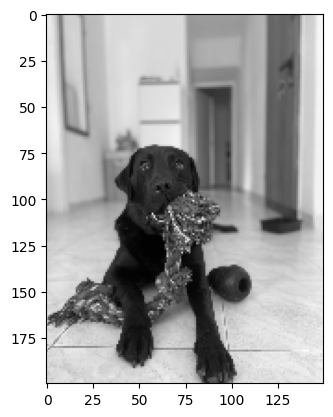

In [57]:
nalla = load_image_as_grayscale('data/nalla.jpg')
nalla = cv2.resize(nalla, (150, 200))
plt.imshow(nalla, cmap='gray')
plt.show()

Much better!

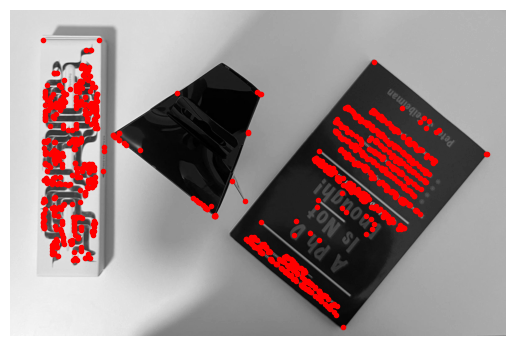

array([[ 797,  263,    0],
       [ 538,  267,    0],
       [1090,  319,    0],
       ...,
       [1033,  963,    4],
       [1044,  973,    4],
       [1074, 1024,    4]])

In [60]:
# second image
detect_and_visualize_keypoints('data/our_shape.jpg','second' , th_contrast=0.03, th_r=5.5)

Let's create threshold comparison plots for these:

In [161]:
def keypoints_threshold_comparison_plot(im: np.ndarray, th_contrasts: List[float] = [0.01, 0.02, 0.03, 0.04, 0.06, 0.08, 0.1, 0.11],
                                        th_rs: List[float] = [4, 4.5, 5, 6, 8, 10, 12, 24]):
    # Create a 3x3 grid of subplots
    fig, axes = plt.subplots(nrows=len(th_contrasts), ncols=len(th_rs), figsize=(20, 20))
    fig.suptitle('Keypoint Detection with Various Thresholds \n\n')

    # Iterate over each combination of thresholds
    for i, th_contrast in enumerate(th_contrasts):
        for j, th_r in enumerate(th_rs):
            # Detect keypoints with current thresholds
            locsDoGs = DoGdetector_loop(im, sigma0, k, levels, th_contrasts=[th_contrast], th_rs=[th_r]) # ended up not using the built in loop
            locsDoG = np.array(locsDoGs[0]) 
            
            # Plot keypoints on the corresponding subplot
            ax = axes[i, j]
            ax.imshow(im, cmap='gray')
            if len(locsDoG) > 0:
                ax.plot(locsDoG[:, 0], locsDoG[:, 1], 'r.')
            ax.axis('off')
            ax.set_title(f'Min Contrast: {th_contrast} \n Max Curvature: {th_r}')

    # Adjust layout
    plt.tight_layout()
    plt.show()

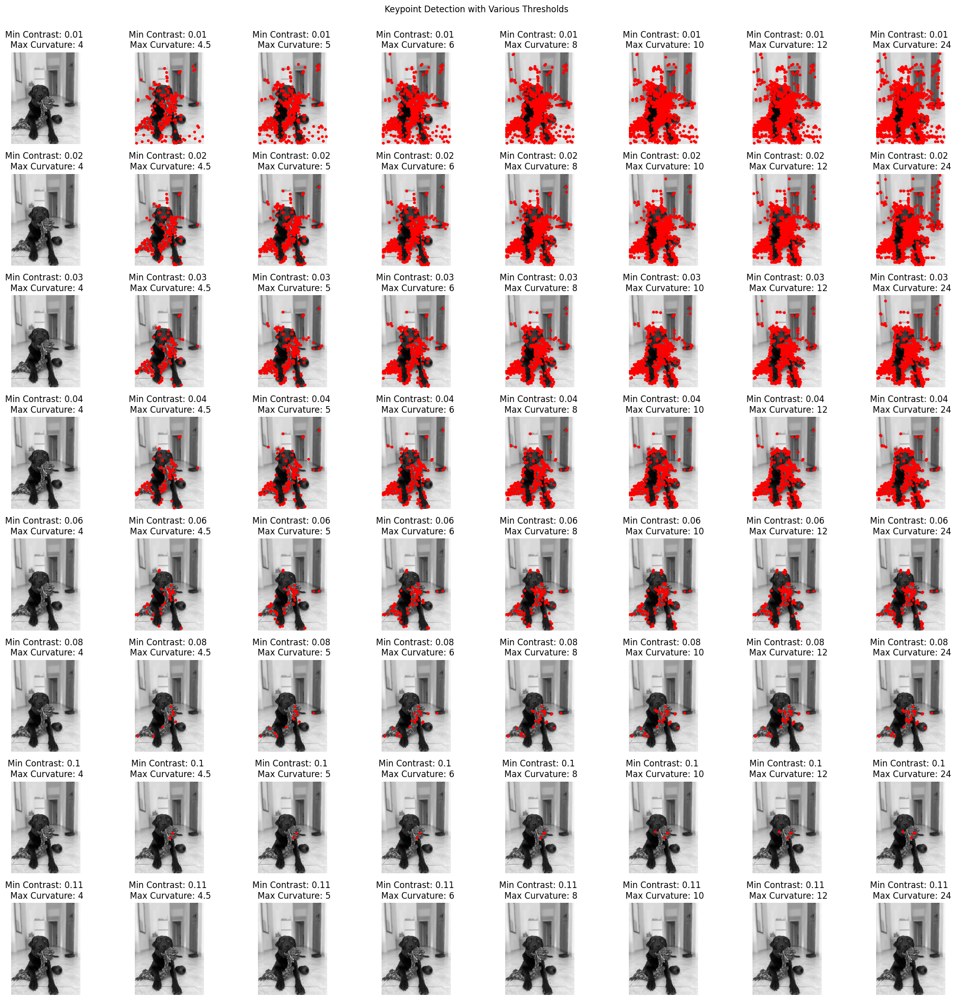

In [162]:
im = load_image_as_grayscale('data/nalla.jpg')
im = cv2.resize(im, (150, 200))

keypoints_threshold_comparison_plot(im)

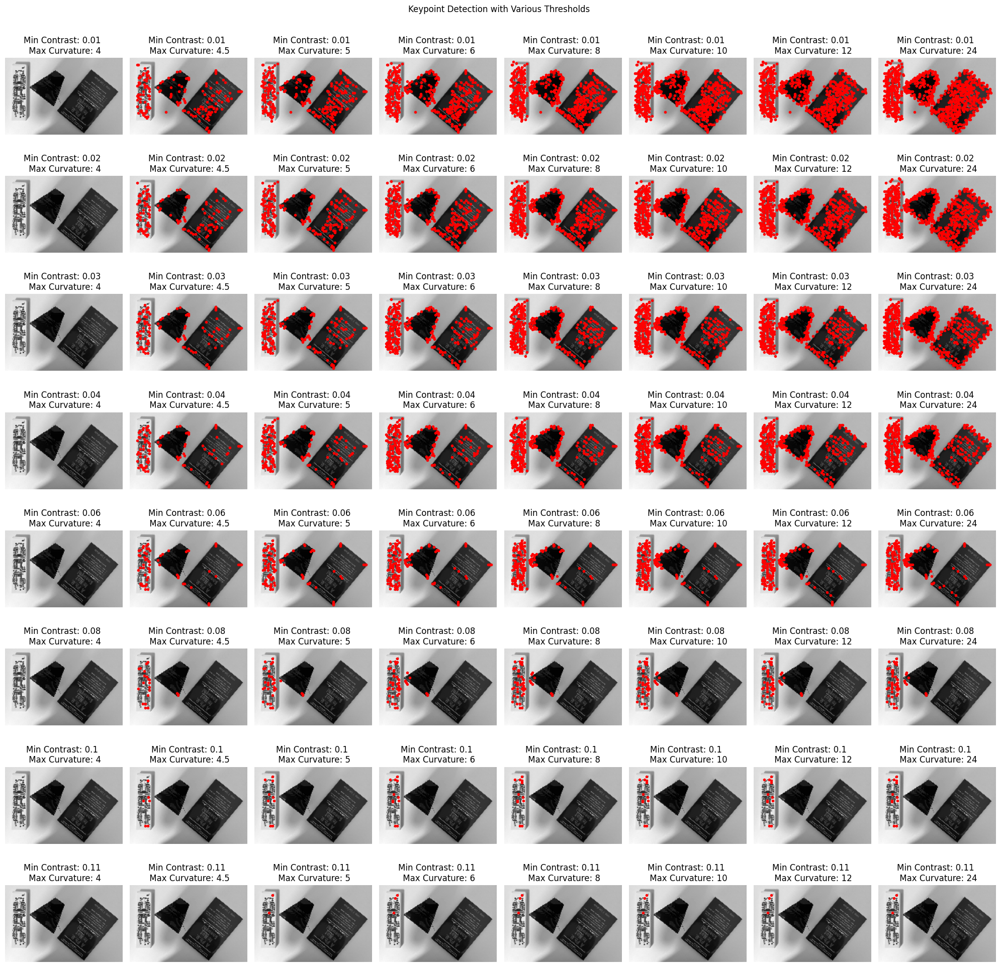

In [163]:
im = load_image_as_grayscale('data/our_shape.jpg')
im = cv2.resize(im, (160, 105)) # originally 1600 x 1052
keypoints_threshold_comparison_plot(im)

#### Part 2 - BRIEF Descriptor
---
Now that we have interest points that tell us where to find the most informative feature points in the image, we would like to describe each keypoint region with a descriptor. Then we can use those descriptors to match corresponding points between different images. The BRIEF descriptor encodes information from a 9 × 9 patch $p$ centered around the interest point (optimally at the <em>characteristic scale</em> of the
interest point). You can read more in
<a href="https://docs.opencv.org/4.5.1/dc/d7d/tutorial_py_brief.html">BRIEF</a> (Verify that you are looking at the docs for your installed version).


#### 2.1 Creating a Set of BRIEF Tests
The descriptor itself is a vector that is $n$-bits long, where each bit is the result of the following simple test:

$ \rho(p;x,y):= \begin{cases}
1, & \text{ if } p(x)<p(y) \\ 
 0, & \text{ otherwise. } \\
\end{cases}\\
\\
x,y \in N^{S^2}\\
p \in R^{S^2}
$

Where $S=9$ is the width and hight sizes of a patch $p$, so $x,y$ are each a pixel location within a flatten patch.
Set $n$ to 256 bits. There is no need to encode the test results as actual bits. It is fine to encode them as a 256 element vector.

<img src="./assets/BRIEF_test_vis.png" width="200">

There are many choices for the 256 test pairs $(x,y)$ used to compute $\rho (p; x,y)$ (each of the $n$ bits). 
The authors describe and test some of them in <a href="https://www.tugraz.at/fileadmin/user_upload/Institute/ICG/Images/team_lepetit/publications/calonder_eccv10.pdf">[3]</a>. Read section 3.2 of that paper and implement one of these solutions. You should generate a static set of test pairs and save that data to a file. You will use these pairs for all subsequent computations of the BRIEF descriptor.

* Write the function to create the $x$ and $y$ pairs that we will use for comparison to compute $\rho$ :

In [64]:
import scipy.io

def makeTestPattern(patch_width: int, nbits: int) -> Tuple[np.ndarray, np.ndarray]:
    """Creates two arrays of random integers to be used as indices of patches for comparing pixel intensities."""
    np.random.seed(20)
    compareX = np.random.randint(0, patch_width**2, nbits)
    compareY = np.random.randint(0, patch_width**2, nbits)
    
    return compareX, compareY

# Example usage
patch_width = 9
nbits = 256
# compareX, compareY = makeTestPattern(patch_width, nbits)

# Save the results
# scipy.io.savemat('output/testPattern.mat', {'compareX': compareX, 'compareY': compareY})

# Load the results
testPattern = scipy.io.loadmat('output/testPattern.mat')
compareX, compareY = testPattern['compareX'], testPattern['compareY']
print(compareX, compareY)

[[15 28  9 20 75 22 71 34 40 26 16 62 16  7  6 26 13 75 58 25  3 74 75 61
  77 57 32 10  6 75 18  3 77 17 43 16 18 79 59 71 75 29 45  6 63 78 24 18
  33 78 42  3 18 70 52 22 14  4 27 75  8  6 26 79 78 10 33 17 40 42 60 30
  36  8 48 19 48 53 10 38  9 60 60 23 52 76 78 54 73 27 39  9 14 31 56 56
  58 79 27 50 74 69  2 57 23 25 41  9 66 15 65 30 49 40 11 69  0 58 37 68
  18  9 57 14 35 75 23 29 60  2 19 45 60 45 24 75 55 65 51 12 36 41 74 31
  67 76 42  2 39 79  7 11 27 71 23 37 54 33  6 12 36  6 64  7 46  2 26 70
  50 75 19 40 75 70 73 22 80 80 44 41 66 35 49 74 27 50  1 21  5  6 41 68
  10 64  4 75 15 54 11  4 22  6 59 44 73 11 18 52 64 55 64 36 48 58 39 37
  54  5 26 15 55 10 69 17 79 48 38 54 38 71 33 23 77 46 43 24 30 64 33  4
  36 77 27 70 34 32  5 39 16 36 71 59 75 33 21 68]] [[ 6 18 32 24 20  8 72 49 62 29 75 16 54 53 73 66 30 54 65 44 43 58 35 40
  21  0 21 37 18 36  0 40 43 28 25 45 39 26 64 33 31 39 11 23 51 70 70 48
  43 62 39 16 21 38 61 67 64  5 43 78  0 22 25 72 57 42  8 6

`patchWidth` is the width of the image patch (usually 9) and `nbits` is the number of tests $n$ in the BRIEF descriptor. `compareX` and `compareY` are linear indices into the `patchWidth` $\times$ `patchWidth` image patch and are each `nbits` $\times$ 1 vectors. Run this routine for the given parameters `patchWidth = 9` and `n = 256` and save the results in `testPattern.mat`. You can use `scipy.io.savemat()`. <a href="https://docs.scipy.org/doc/scipy/reference/generated/scipy.io.savemat.html#scipy.io.savemat">Read more here</a>.

* Include this file in your submission (`code` directory).

#### 2.2  Compute the BRIEF Descriptor
Now we can compute the BRIEF descriptor for the detected keypoints.
* Write the function:


In [65]:
def computeBrief(im: np.ndarray, compareX: np.ndarray, compareY: np.ndarray,
                 GaussianPyramid: Union[np.ndarray, Sequence[np.ndarray]],
                 locsDoG: np.ndarray, k: float = np.sqrt(2), levels: List[int] = [-1, 0, 1, 2, 3, 4],
                 patchWidth: int = 9) -> Tuple[np.ndarray, np.ndarray]:
    """
    Given the keypoint locations of an image, compute the BRIEF descriptors
    for those which have patch fully contained in the image.
    Returns the valid keypoint locations and their descriptors.
    """
    desc = []
    valid_locs = []

    half_patch_width = patchWidth // 2
    for point in locsDoG:
        y, x = point[0], point[1]
        if (x - half_patch_width < 0 or x + half_patch_width >= im.shape[1] or
            y - half_patch_width < 0 or y + half_patch_width >= im.shape[0]):
            continue
        
        patch = im[y-half_patch_width:y+half_patch_width+1, x-half_patch_width:x+half_patch_width+1].flatten()
        brief_desc = patch[compareX] < patch[compareY]
        desc.append(brief_desc)
        valid_locs.append(point)

    return np.array(valid_locs), np.array(desc)[:,0,:] # this 0 is because of the dimensions of desc: (m, 1, n)

Where `im` is a grayscale image with values from 0 to 1, `locsDoG` are the keypoint locations returned by the DoG detector from Section 1.6, `levels` are the Gaussian scale levels that were given in Section 1, and `compareX` and `compareY` are the test patterns computed in Section 2.1 and were saved into `testPattern.mat` (load them with `scipy.io.loadmat()`, <a href="https://docs.scipy.org/doc/scipy/reference/generated/scipy.io.loadmat.html">read more</a>).

The function returns `locs`, an $m \times 3$ matrix, where the first two columns are the image coordinates of keypoints and the third column is the pyramid level of the keypoints, and desc is an $m \times n$ bits matrix of stacked BRIEF descriptors. `m` is the number of valid descriptors in the image and will vary. You may have to be careful about the input DoG detector locations since they may be at the edge of an image where we cannot extract a full patch of width `patchWidth`. Thus, the number of output locs may be less than the input `locsDoG`. 

**Note**: Its possible that you may not require all the arguments to this function to compute the desired output. They have just been provided to permit the use of any of some different approaches to solve this problem.

#### 2.3  Putting it all Together
* Write a function:


Which accepts a grayscale image `im` with values between 0 and 1 and returns `locs`, an $m \times 3$ matrix, where the first two columns are the image coordinates of keypoints and the third column is the pyramid level of the keypoints, and `desc`, an $ m \times n$ bits matrix of stacked BRIEF descriptors. `m` is the number of valid descriptors in the image and
will vary. `n` is the number of bits for the BRIEF descriptor.

This function should perform all the necessary steps to extract the descriptors from the image, including: (1) Load parameters and test patterns, (2) Get keypoint locations, and (3) Compute a set of valid BRIEF descriptors.

In [66]:
def briefLite(im, sigma0: int = 1, k: float = np.sqrt(2),
              levels: List[int] = [-1, 0, 1, 2, 3, 4],
              th_contrast: float = 0.03, th_r: float = 12,
              patch_width: int = 9, nbits: int = 256) -> Tuple[np.ndarray, np.ndarray]:
    """Returns valid keypoint locations and their descriptors."""
    
    # im should be grayscale and normalized.
    locsDoG, GaussianPyramid = DoGdetector(im, sigma0, k, levels, th_contrast, th_r)

    # load compareX and compareY using scipy.io.loadmat
    testPattern = scipy.io.loadmat('output/testPattern.mat')
    compareX, compareY = testPattern['compareX'], testPattern['compareY']
    
    locs, desc = computeBrief(im, compareX, compareY, GaussianPyramid, locsDoG)

    return locs, desc

Check if any keypoints are removed: (seems that the images checked here do not have keypoints close enough to the edge of the image for them to be removed)

[[123, 50, 0], [137, 50, 0], [125, 52, 0], [127, 52, 0], [137, 54, 0], [137, 56, 0], [133, 60, 0], [126, 62, 0], [132, 62, 0], [122, 64, 0], [122, 67, 0], [139, 71, 0], [54, 73, 0], [122, 75, 0], [139, 75, 0], [52, 76, 0], [134, 76, 0], [122, 78, 0], [122, 82, 0], [134, 82, 0], [47, 84, 0], [55, 84, 0], [42, 85, 0], [56, 86, 0], [165, 87, 0], [57, 88, 0], [64, 88, 0], [111, 89, 0], [137, 90, 0], [58, 91, 0], [62, 91, 0], [33, 92, 0], [111, 92, 0], [15, 94, 0], [35, 94, 0], [44, 94, 0], [137, 94, 0], [140, 94, 0], [38, 95, 0], [122, 95, 0], [14, 96, 0], [21, 96, 0], [58, 96, 0], [61, 96, 0], [163, 96, 0], [208, 96, 0], [212, 96, 0], [36, 97, 0], [44, 97, 0], [98, 97, 0], [121, 97, 0], [178, 97, 0], [202, 97, 0], [210, 97, 0], [217, 97, 0], [220, 97, 0], [18, 98, 0], [35, 98, 0], [57, 98, 0], [149, 98, 0], [167, 98, 0], [171, 98, 0], [190, 98, 0], [198, 98, 0], [201, 98, 0], [235, 98, 0], [241, 98, 0], [247, 98, 0], [43, 99, 0], [95, 99, 0], [239, 99, 0], [243, 99, 0], [245, 99, 0], [249

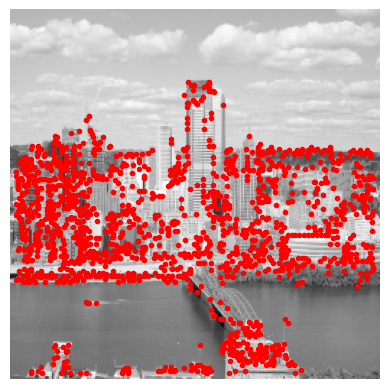

In [86]:
im = load_image_as_grayscale('data/incline_L.png')
# resizes the image to 256x256
im = cv2.resize(im, (256, 256))
# im = cv2.resize(im, (128, 128))

locs, desc = briefLite(im)
all_locs, _ = DoGdetector(im)

print(all_locs)
print(type(locs), type(desc))
arr = [loc for loc in all_locs if loc not in locs]
print(arr)
removed_locs = np.array(arr)
print(type(desc), desc)

# show the output in the image
plt.figure()
plt.imshow(im, cmap='gray')
plt.plot(locs[:, 0], locs[:, 1], 'r.')
if removed_locs.size > 0:
    plt.plot(removed_locs[:, 0], removed_locs[:, 1], 'b.') # plot removed DoG keypoints in blue
plt.axis('off')
plt.show()

[[146, 3, 0], [147, 6, 0], [148, 9, 0], [149, 12, 0], [150, 13, 0], [151, 16, 0], [92, 19, 0], [152, 19, 0], [152, 22, 0], [153, 23, 0], [71, 24, 0], [73, 25, 0], [153, 25, 0], [154, 26, 0], [93, 28, 0], [80, 29, 0], [126, 30, 0], [154, 30, 0], [53, 31, 0], [122, 31, 0], [60, 32, 0], [127, 32, 0], [155, 32, 0], [156, 33, 0], [48, 34, 0], [119, 34, 0], [127, 34, 0], [53, 35, 0], [124, 35, 0], [156, 35, 0], [55, 36, 0], [58, 36, 0], [114, 36, 0], [157, 36, 0], [60, 37, 0], [83, 37, 0], [93, 37, 0], [103, 37, 0], [120, 37, 0], [126, 37, 0], [51, 38, 0], [116, 38, 0], [53, 39, 0], [112, 39, 0], [157, 39, 0], [158, 39, 0], [61, 40, 0], [124, 40, 0], [116, 41, 0], [130, 41, 0], [28, 42, 0], [126, 42, 0], [43, 43, 0], [119, 43, 0], [157, 43, 0], [104, 44, 0], [113, 44, 0], [115, 44, 0], [117, 44, 0], [129, 44, 0], [45, 45, 0], [126, 45, 0], [50, 46, 0], [75, 46, 0], [157, 46, 0], [44, 47, 0], [50, 48, 0], [45, 49, 0], [43, 50, 0], [127, 50, 0], [129, 51, 0], [121, 53, 0], [165, 53, 0], [29, 5

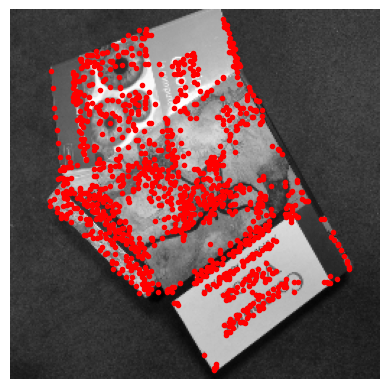

In [84]:
im = load_image_as_grayscale('data/pf_pile.jpg')
# resizes the image to 256x256
im = cv2.resize(im, (256, 256))
# im = cv2.resize(im, (128, 128))

locs, desc = briefLite(im)
all_locs, _ = DoGdetector(im)

print(all_locs)
print(type(locs), type(desc))
arr = [loc for loc in all_locs if loc not in locs]
print(arr)
removed_locs = np.array(arr)

# show the output in the image
plt.figure()
plt.imshow(im, cmap='gray')
plt.plot(locs[:, 0], locs[:, 1], 'r.')
if removed_locs.size > 0:
    plt.plot(removed_locs[:, 0], removed_locs[:, 1], 'b.') # plot removed DoG keypoints in blue
plt.axis('off')
plt.show()

#### 2.4   Check Point: Descriptor Matching
A descriptor’s strength is in its ability to match to other descriptors generated by the same world point despite change of view, lighting, etc. The distance metric used to compute the similarity between two descriptors is critical. For BRIEF, this distance metric is the Hamming distance. The Hamming distance is simply the number of bits in two descriptors that differ. (Note that the position of the bits matters.)

To perform the descriptor matching mentioned above, we have provided you the function `briefMatch`:

In [85]:
from scipy.spatial.distance import cdist

def briefMatch(desc1: np.ndarray, desc2: np.ndarray, ratio: float = 0.8) -> np.ndarray:
    #     performs the descriptor matching
    #     inputs  : desc1 , desc2 - m1 x n and m2 x n matrices. m1 and m2 are the number of keypoints in image 1 and 2.
    #                               n is the number of bits in the brief
    #               ratio         - ratio used for testing whether two descriptors should be matched.
    #     outputs : matches       - p x 2 matrix. where the first column are indices
    #                                         into desc1 and the second column are indices into desc2  
    D = cdist(np.float32(desc1), np.float32(desc2), metric='hamming')
    # find smallest distance
    ix2 = np.argmin(D, axis=1)
    d1 = D.min(1)
    # find second smallest distance
    d12 = np.partition(D, 2, axis=1)[:,0:2]
    d2 = d12.max(1)
    r = d1/(d2+1e-10)
    is_discr = r<ratio
    ix2 = ix2[is_discr]
    ix1 = np.arange(D.shape[0])[is_discr]
    matches = np.stack((ix1,ix2), axis=-1)
    return matches

Which accepts an $m1 \times n$ bits stack of BRIEF descriptors from a first image and a $m2 \times n$ bits stack of BRIEF descriptors from a second image and returns a $p \times 2$ matrix of matches, where the first column are indices into `desc1` and the second column are indices into `desc2`. Note that `m1`, `m2`, and `p` may be different sizes and $p \leq \min(m1, m2)$.

* Write a test script `testMatch` to load two of the chickenbroth images and compute feature matches. Use the provided `plotMatches` and `briefMatch` functions to visualize the result.

* Use the following function to display the matched points.

In [119]:
def plotMatches(im1, im2, matches, locs1, locs2, show_bool: bool = True):
    fig = plt.figure()
    # draw two images side by side
    imH = max(im1.shape[0], im2.shape[0])
    im = np.zeros((imH, im1.shape[1]+im2.shape[1]), dtype='uint8')
    im[0:im1.shape[0], 0:im1.shape[1]] = im1
    im[0:im2.shape[0], im1.shape[1]:] = im2
    plt.imshow(im, cmap='gray')
    for i in range(matches.shape[0]):
        pt1 = locs1[matches[i,0], 0:2]
        pt2 = locs2[matches[i,1], 0:2].copy()
        pt2[0] += im1.shape[1]
        x = np.asarray([pt1[0], pt2[0]])
        y = np.asarray([pt1[1], pt2[1]])
        plt.plot(x,y,'r')
        plt.plot(x,y,'g.')
    if show_bool:
        plt.show()
    return fig

In [125]:
def load_image_for_testMatch(image_path: str, normalize: bool = True) -> np.ndarray:
    """Loads an image from the given path and returns it as a grayscale image of shape (256, 256)."""
    im = cv2.imread(image_path)
    im = cv2.resize(im, (256, 256))
    im = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
    if normalize:
        im = im / 255.0 # NOTE: this is critical for feature extraction but make sure to visualize without this
    return im


def testMatch(im1_path: str, im2_path: str,
              sigma0 = 1, k = np.sqrt(2), levels = [-1, 0, 1, 2, 3, 4],
              th_contrast: float = 0.03, th_r: float = 12,
              patch_width: int = 9, nbits: int = 256, ratio: float = 0.8) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
    """Load the two images and returns the matches between their keypoints."""

    im1 = load_image_for_testMatch(im1_path)
    im2 = load_image_for_testMatch(im2_path)

    locs1, desc1 = briefLite(im1, sigma0=sigma0, k=k, levels=levels, th_contrast=th_contrast, th_r=th_r, patch_width=patch_width, nbits=nbits)
    locs2, desc2 = briefLite(im2, sigma0=sigma0, k=k, levels=levels, th_contrast=th_contrast, th_r=th_r, patch_width=patch_width, nbits=nbits)

    return briefMatch(desc1, desc2, ratio=ratio), locs1, locs2

Test `testMatch`

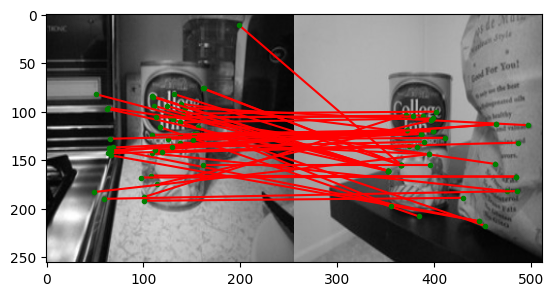

In [136]:
# test images
im_paths = ['data/chickenbroth_01.jpg',
            'data/chickenbroth_02.jpg', 'data/chickenbroth_03.jpg',
            'data/chickenbroth_04.jpg']
im1_path = im_paths[2]
im2_path = im_paths[3]

im1 = load_image_for_testMatch(im1_path)
im2 = load_image_for_testMatch(im2_path)

# get the matches
matches, locs1, locs2 = testMatch(im1_path, im2_path, ratio=0.8) # using th_contrast=0.01, th_r=24 did not help
# print(matches)

# reload images without normalization
im1_display = load_image_for_testMatch(im1_path, normalize=False)
im2_display = load_image_for_testMatch(im2_path, normalize=False)

# plot the matches
plotMatches(im1_display, im2_display, matches, locs1, locs2);

Check different ratios:

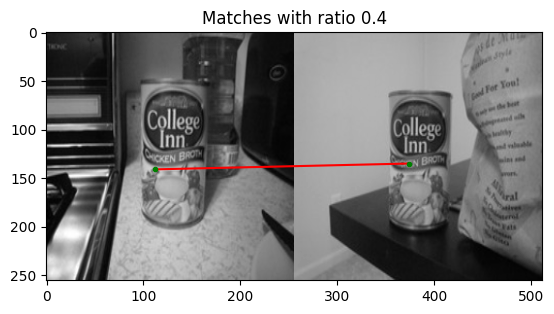

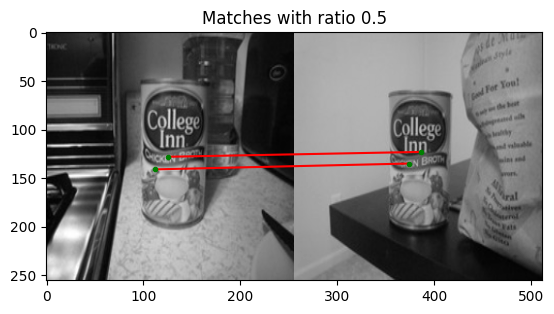

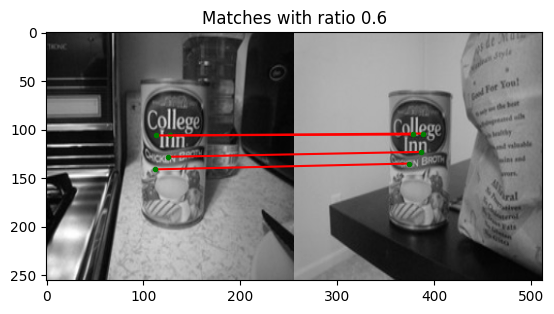

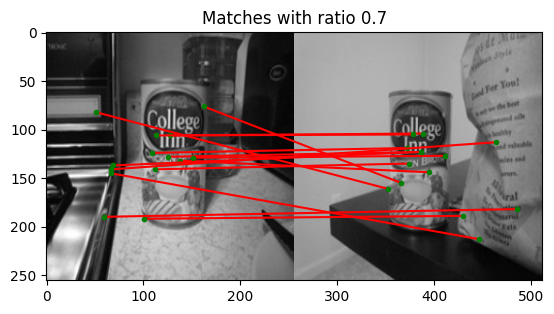

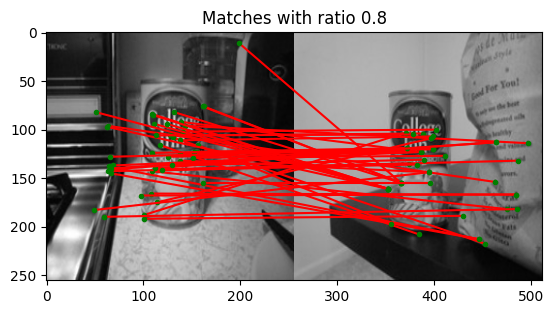

In [133]:
ratios = [0.4, 0.5, 0.6, 0.7, 0.8]

for rat in ratios:
    matches, locs1, locs2 = testMatch(im1_path, im2_path, ratio=rat)
    plotMatches(im1_display, im2_display, matches, locs1, locs2, show_bool=False)
    ax = plt.gca()
    ax.set_title(f'Matches with ratio {rat}')
    plt.show()

Check resize:

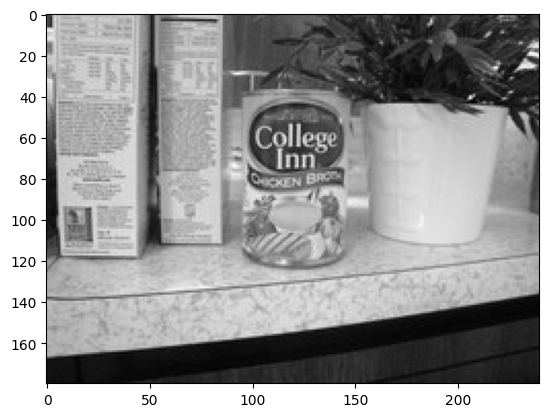

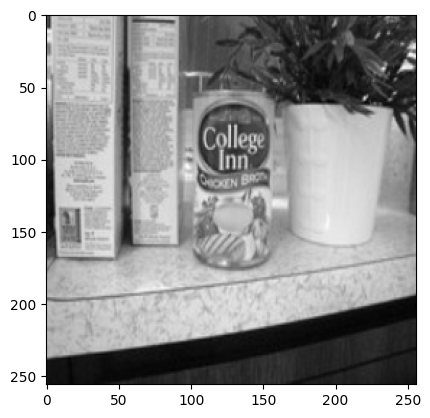

In [128]:
test = load_image_as_grayscale('data/chickenbroth_05.jpg')

plt.figure()
plt.imshow(test, cmap='gray')

newtest = cv2.resize(test, (256, 256))
plt.figure()
plt.imshow(newtest, cmap='gray')

A test for different image combinations:

In [100]:
def plot_all_match_detections(image_paths: List[str], th_contrast: float = 0.03, th_r: float = 12):
    indices = list(range(len(image_paths)))
    print(indices)
    for i in indices:
        im1_path = image_paths[i]
        im1 = load_image_for_testMatch(im1_path, normalize=False)
        print(im1_path)
        for j in indices[i + 1:]:
            im2_path = image_paths[j]
            print('Loading', im2_path)
            im2 = load_image_for_testMatch(im2_path)
            print('Matching')
            matches, locs1, locs2 = testMatch(im1_path, im2_path, th_contrast=th_contrast, th_r=th_r)
            print('Reloading', im2_path, 'without normalization')
            im2 = load_image_for_testMatch(im2_path, normalize=False)
            plotMatches(im1, im2, matches, locs1, locs2)

[0, 1, 2, 3]
data/chickenbroth_01.jpg
Loading data/chickenbroth_02.jpg
Matching
Reloading data/chickenbroth_02.jpg without normalization


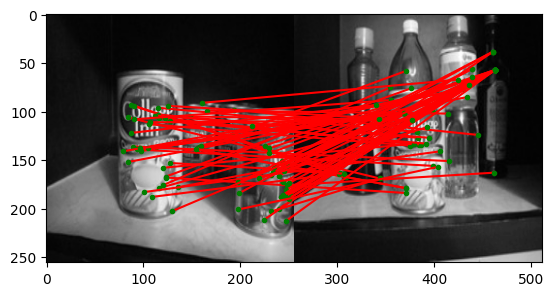

Loading data/chickenbroth_03.jpg
Matching
Reloading data/chickenbroth_03.jpg without normalization


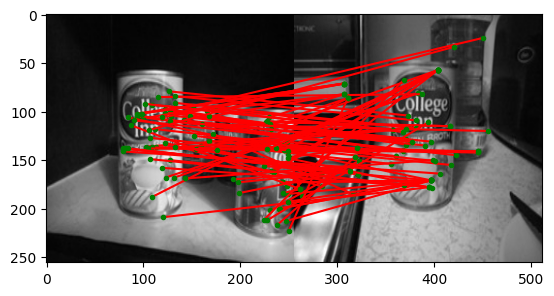

Loading data/chickenbroth_04.jpg
Matching
Reloading data/chickenbroth_04.jpg without normalization


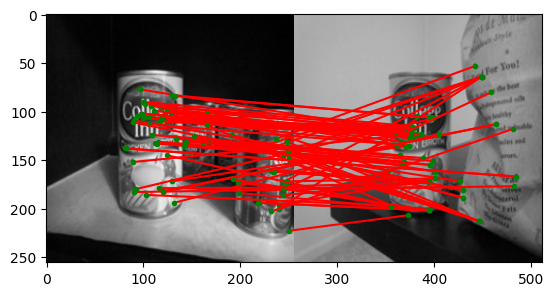

data/chickenbroth_02.jpg
Loading data/chickenbroth_03.jpg
Matching
Reloading data/chickenbroth_03.jpg without normalization


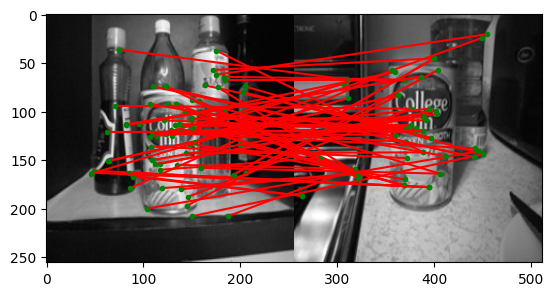

Loading data/chickenbroth_04.jpg
Matching
Reloading data/chickenbroth_04.jpg without normalization


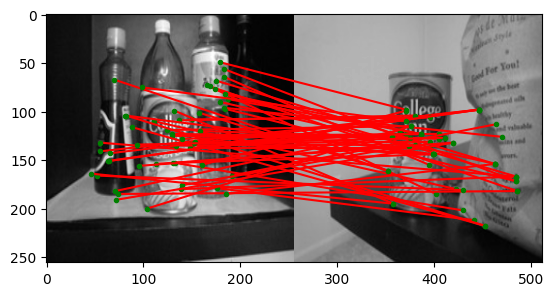

data/chickenbroth_03.jpg
Loading data/chickenbroth_04.jpg
Matching
Reloading data/chickenbroth_04.jpg without normalization


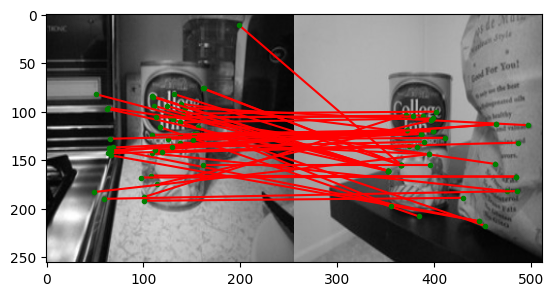

data/chickenbroth_04.jpg


In [137]:
plot_all_match_detections(im_paths)

#### 2.5   BRIEF properties

Having tested the performance of BRIEF on the provided sample images, what can you conclude regarding its limitations? Answer the following questions in your PDF report:

* Is BRIEF invariant to illumination changes?
* Assuming we want to boost the invariance of BRIEF to scale, which part of the SIFT algorithm should we include?

You may have noticed worse performance under rotations. Let’s investigate this!

* Take the `model_chickenbroth.jpg` test image and match it to itself while rotating the second image in increments of 10 degrees. Count the number of correct matches at each rotation and construct a bar graph showing rotation angle vs the number of correct matches.

* To rotate the image and calculate the new center, we have provided you the function `rotateImage`:

In [143]:
def rotateImage(image, theta):
    # rotates an image and calculates the new center pixel
    # INPUTS
    #      image      - HxW image to be rotated 
    #      theta      - rotation angle in degrees [0,360]
    # OUTPUTS
    #      image_rot  - H2xW2 rotated image 
    #      center_rot - (2,) array of the new center pixel
    (h, w) = image.shape[:2]
    (cX, cY) = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D((cX, cY), -theta, 1.0)
    cos = np.abs(M[0, 0])
    sin = np.abs(M[0, 1])
    nW = int((h * sin) + (w * cos))
    nH = int((h * cos) + (w * sin))
    M[0, 2] += (nW / 2) - cX
    M[1, 2] += (nH / 2) - cY
    image_rot = cv2.warpAffine(image, M, (nW, nH))
    center_rot = (np.array(image_rot.shape[:2][::-1])-1)/2
    return image_rot, center_rot

Which accepts two input arguments: an $H \times W$ grayscale image `image` with values between 0 and 1, and an angle `theta` in degrees. This function returns `image_rot`, an $H1 \times W1$ rotated image, and $2 \times 1$ vector `center_rot`, which is the new center pixel of the grid. Note that image rotation changes the size and introduces translation of the center pixel of the grid. Hence, this needs to be taken into acount when comparing the matched keypoints.

Text(0.5, 1.0, 'Rotated')

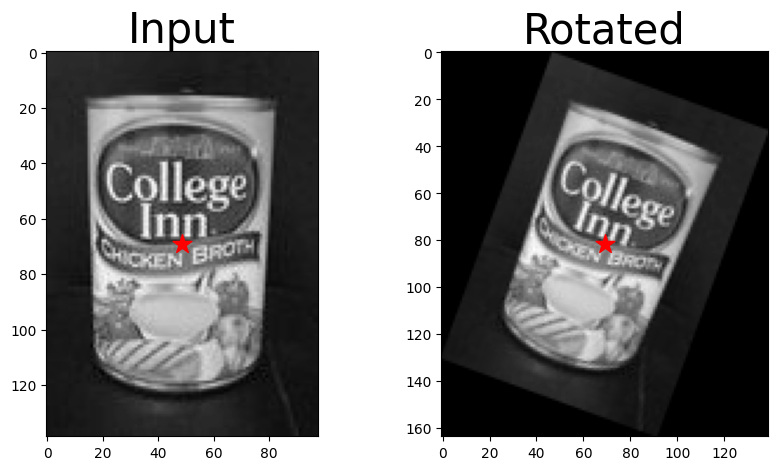

In [144]:
# example:
im = cv2.imread('data/model_chickenbroth.jpg')
im = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
im = im / 255
center = (np.array(im.shape[:2][::-1])-1)/2
theta = 20.0
im_rot, center_rot = rotateImage(im, theta)

plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(im, cmap="gray")
plt.scatter(center[0], center[1], 200, 'r', '*')
plt.title("Input", fontsize=30)
plt.subplot(1,2,2)
plt.imshow(im_rot, cmap="gray")
plt.scatter(center_rot[0], center_rot[1], 200, 'r', '*')
plt.title("Rotated", fontsize=30)

* Write a test script `briefRotTest` that counts the number of correct matches of the image `model_chickenbroth.jpg` as a function of rotation angle. 
* Use the provided function `checkRotLocs` to count the number of correctly matched points.

In [145]:
def checkRotLocs(locs0, locsTheta, matches, theta, 
                 c0, cTheta, th_d=9.0):
    # INPUTS
    #     locs0     - m1x3 matrix of keypoints (x,y,l) of the unrotated image
    #     locsTheta - m2x3 matrix of keypoints (x,y,l) of the rotated image
    #     matches   - px2 matrix of matches indexing into locs0 and locsTheta
    #     theta     - rotation angle in degress
    #     c0        - center of the unrotated image
    #     cTheta    - center of the rotated image
    #     th_d      - threshold distance of matched keypoints in pixels
    # OUTPUTS
    #     corrMatch - number of correct matches
    # keep only the matched keypoints (x,y)
    locs0 = locs0[matches[:,0],:2]
    locsTheta = locsTheta[matches[:,1],:2]
    # rotate the locations at theta=0 and shift them to the new center
    theta = np.deg2rad(theta)
    rot_mat = np.array([[np.cos(theta), -np.sin(theta)],
                        [np.sin(theta), np.cos(theta)]])
    locs0_rot = (rot_mat@(locs0-c0).T).T+cTheta
    # count the number of correct matches with a distance threshold Td
    corrMatch = np.sum(np.sqrt(np.sum((locs0_rot-locsTheta)**2, 1)) < th_d)
    return corrMatch

In [146]:
def briefRotTest(im):
    angles = np.arange(0, 360, 10)
    correct_matches = []
    for theta in angles:
        im_rotate, center2 = rotateImage(im, theta)
        locs1, desc1 = briefLite(im)
        locs2, desc2 = briefLite(im_rotate)
        matches = briefMatch(desc1, desc2)
        corrMatch = checkRotLocs(locs1, locs2, matches, theta, center, center2)
        correct_matches.append(corrMatch)
        
    plt.figure(figsize=(10,5))
    plt.bar(angles, correct_matches, width=8)
    plt.xlabel('Rotation Angle (degrees)')
    plt.ylabel('Correct Matches')
    plt.title('Rotation Angle vs Correct Matches')
    plt.show()

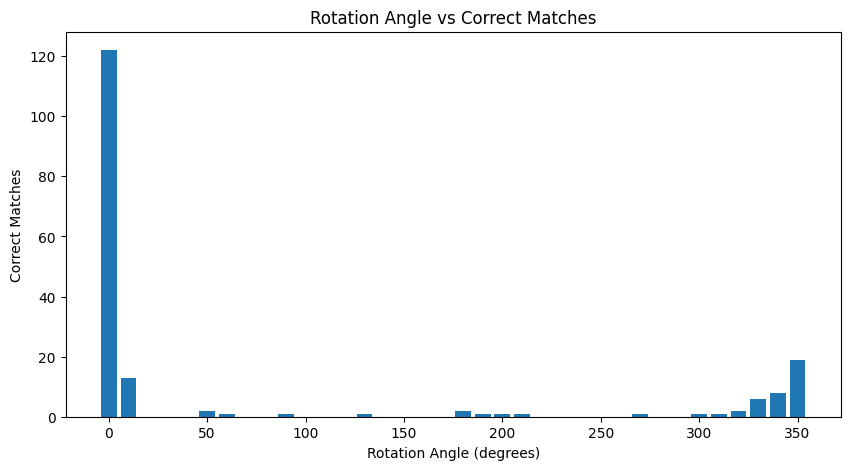

In [153]:
im = load_image_as_grayscale('data/model_chickenbroth.jpg')
briefRotTest(im)

This function takes as input the following: the detected keypoints `locs0` in the unrotated image ($m1 \times 3$ matrix of $(x,y,l)$), the detected keypoints `locsTheta` in the rotated image ($m2 \times 3$ matrix of $(x,y,l)$), the computed matches `matches` using the function `briefMatch` ($p \times 2$ matrix), the rotation angle `theta` in degrees, the center of the unrotated image `c0`, the center of the rotated image `cTheta`, and a distance threshld in pixels `th_d`. This threshold is used to decide whether the keypoints `locs0` after rotation and shift are matched correctly to the detected keypoints in the rotated image `locsTheta` (i.e. $|T_{\theta}(xy_0) - xy_{\theta}| < \theta_d$). (Suggested value `th_d=9.0`).

The function returns the number of correct matches `corrMatch` which is a scalar.

* Include the resulting bar plot in your PDF and explain why you think the descriptor behaves this way.

where `im1` and `im2` are BGR images loaded by `cv2.imread()`, `matches` is the list of matches returned by `briefMatch` and `locs1` and `locs2` are the locations of keypoints from `briefLite`.

* Save the resulting figure and submit it in your PDF report. Also, present results with the two `incline*.jpg` images and with the computer vision textbook cover page (template is in file `pf_scan_scaled.jpg`) against the other `pf_*` images. Briefly discuss any cases that perform worse or better.

* Suggestion for debugging: A good test of your code is to check that you can match an image to itself.

(256, 256)

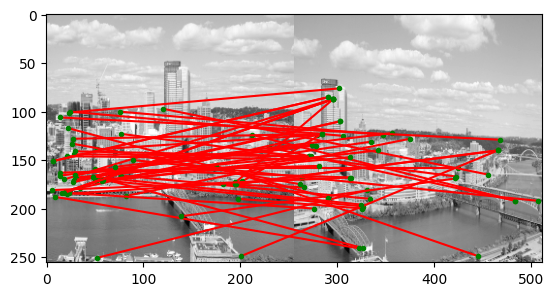

In [138]:
# Step-by-step example usage
im1 = cv2.imread('data/incline_L.png')
im1 = cv2.resize(im1, (256, 256))
im1_1 = cv2.cvtColor(im1, cv2.COLOR_BGR2GRAY)
im1_1 = im1_1 / 255

im2 = cv2.imread('data/incline_R.png')
im2 = cv2.resize(im2, (256, 256))
im2_1 = cv2.cvtColor(im2, cv2.COLOR_BGR2GRAY)
im2_1 = im2_1 / 255

display(im2_1.shape)

# Get the key points and descriptors
locs1, desc1 = briefLite(im1_1)
locs2, desc2 = briefLite(im2_1)

# Match BRIEF descriptors
matches = briefMatch(desc1, desc2)

# Visualize the matches
im1 = load_image_for_testMatch('data/incline_L.png', normalize=False)
im2 = load_image_for_testMatch('data/incline_R.png', normalize=False)
plotMatches(im1, im2, matches, locs1, locs2)

In [150]:
# Use the provided function `checkRotLocs` to count the number of correctly matched points.
im1 = cv2.imread('data/model_chickenbroth.jpg')
im1 = cv2.resize(im1, (256, 256))
im1 = cv2.cvtColor(im1, cv2.COLOR_BGR2GRAY)
im1 = im1 / 255
center = (np.array(im1.shape[:2][::-1])-1)/2

# Rotate the image and calculate the new center
theta = 90
im2, center2 = rotateImage(im1, theta)

# Get the key points and descriptors
locs1, desc1 = briefLite(im1)
locs2, desc2 = briefLite(im2)

# Match BRIEF descriptors
matches = briefMatch(desc1, desc2)

# Count the number of correct matches
corrMatch = checkRotLocs(locs1, locs2, matches, theta, center, center2)

print(f"Number of correct matches at {theta} degrees: {corrMatch}")

Number of correct matches at 90 degrees: 2


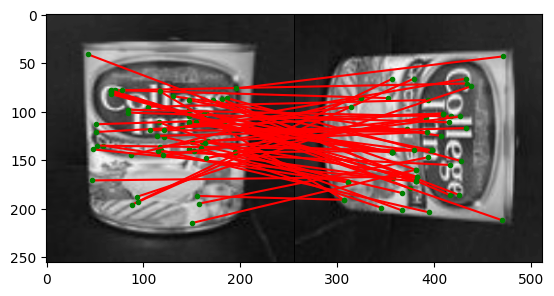

In [151]:
plotMatches(im1 * 255, im2 * 255, matches, locs1, locs2)

#### 2.6   Oriented Fast and Rotated BRIEF (ORB)

As you saw in the previous section BRIEF is not rotation-invariant. This is where ORB <a href="http://www.gwylab.com/download/ORB_2012.pdf">[4]</a> comes into play. ORB is basically a fusion of FAST keypoint detector and BRIEF descriptor with many modifications to enhance the performance (<a href="https://docs.opencv.org/4.5.1/d1/d89/tutorial_py_orb.html">read more here</a>). 

* Repeat the previous task with the ORB descriptor using OpenCV `cv2.ORB_create()`, and compare your results with section 2.5.
* Implementaton guidance:
    * Use `orb = cv2.ORB_create()` to instantiate the ORB detector and `orb.detectAndCompute()` to detect keypoints and compute descriptors.
    * Match the detected keypoints using OpenCV brute-force matcher `cv2.BFMatcher()` (<a href="https://docs.opencv.org/4.5.1/dc/dc3/tutorial_py_matcher.html">read more here</a>).
    * Compute the number of correct matches using the function `checkRotLocs` from section 2.5. Use the provided function `openCV2numpy` to access the attributes of the "DMatch" objects returned by OpenCV matcher, and transfer them to numpy arrays. 

In [153]:
# translate openCV to our data structs
def openCV2numpy(kp1, kp2, matches):
    # function transfers OpenCV keypoints and matches to numpy arrays
    # INPUTS
    #     kp1        - keypoints detected for img 1 using orb.detectAndCompute()
    #     kp2        - keypoints detected for img 2 using orb.detectAndCompute()
    #     matches    - matches returned by cv2.BFMatcher()
    # OUTPUTS
    #     locs1      - m1x3 matrix of keypoints (x,y,l)
    #     locs2      - m2x3 matrix of keypoints (x,y,l)
    #     matches_np - px2 matrix indexing into locs1 and locs2
    
    locs1 = np.array([[kp1[idx].pt[0],kp1[idx].pt[1], float(kp1[idx].octave)] 
                      for idx in range(0, len(kp1))]).reshape(-1, 3)
    locs2 = np.array([[kp2[idx].pt[0],kp2[idx].pt[1], float(kp2[idx].octave)] 
                      for idx in range(0, len(kp2))]).reshape(-1, 3)
    matches_np = [[mat.queryIdx, mat.trainIdx] for mat in matches]
    matches_np = np.stack(matches_np)
    return locs1, locs2, matches_np

This function takes as input the detected "Keypoint" objects: `kp1` in image 1, and `kp2` in image 2 (using `orb.detectAndCompute()`), and their "DMatch" objects `matches` (using `cv2.BFMatcher()`). The function returns the detected keypoints and matches in numpy arrays: `locs1` ($m1 \times 3$ matrix of $(x,y,l)$) for image 1, `locs2` ($m2 \times 3$ matrix of $(x,y,l)$) for image 2, and `matches_np` ($p \times 2$ matrix).

**Note**: OpenCV functions expect to recieve images in BGR format. Therefore, you may pass in images after they are transfered back into `uint8` and converted using `cv2.cvtColor(., cv2.COLOR_GRAY2BGR)`.

* Write a test script `orbTest` that counts the number of correct matches of the image `model_chickenbroth.jpg` as a function of rotation angle using the ORB descriptor.
* Include the resulting bar plot in your PDF and explain the key differences that make ORB rotation-invariant compared to BRIEF. Which components in ORB are borrowed from SIFT?
* Suggestion for debugging - You can visualize the returned list of "DMatch" objects by `cv2.BFMatcher()` using the OpenCV function `cv2.drawMatches()`. To make visual inspection easier, you can sort the matches and look only at the `K` (e.g. 10-20) strongest ones.

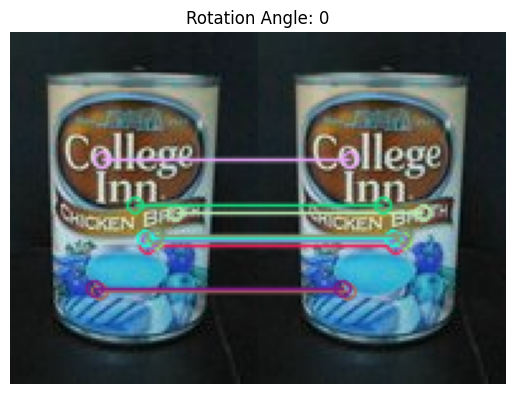

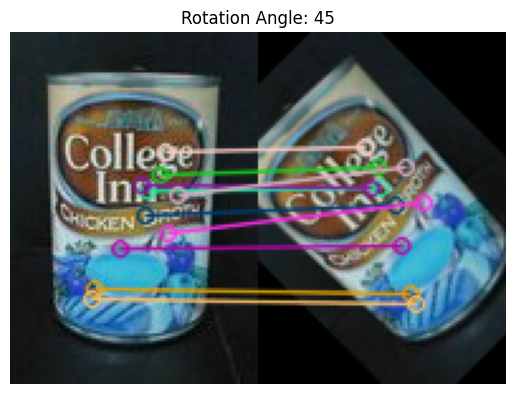

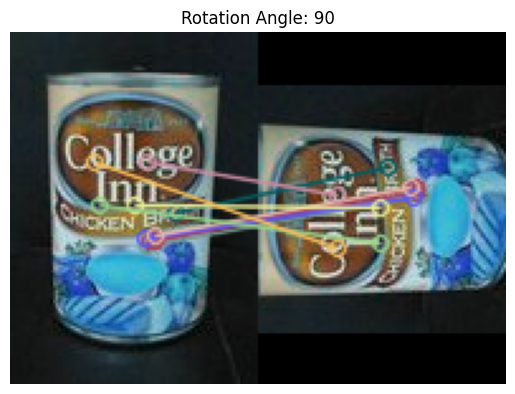

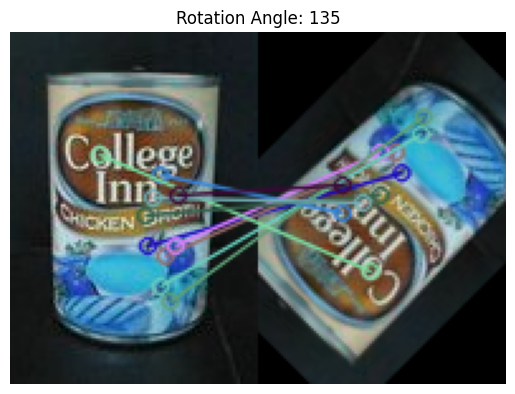

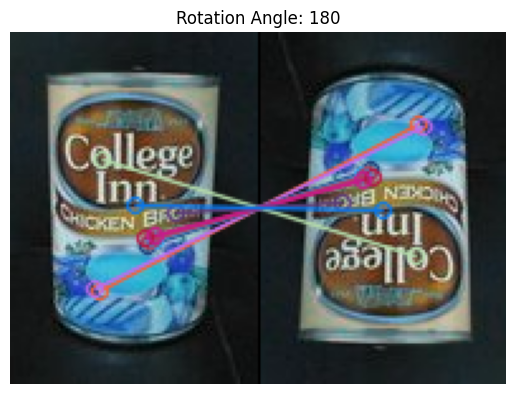

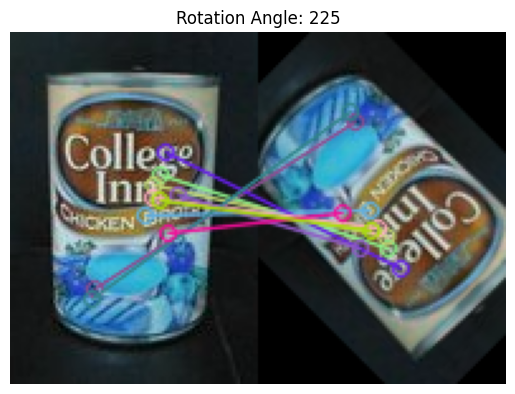

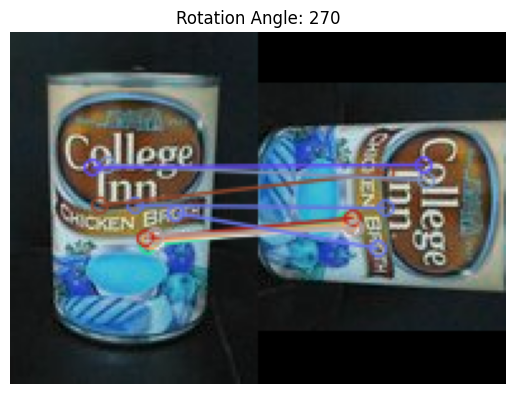

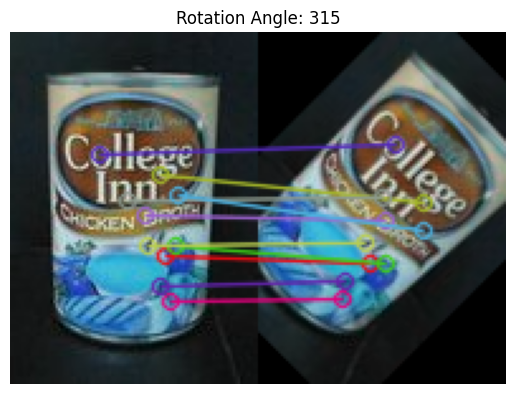

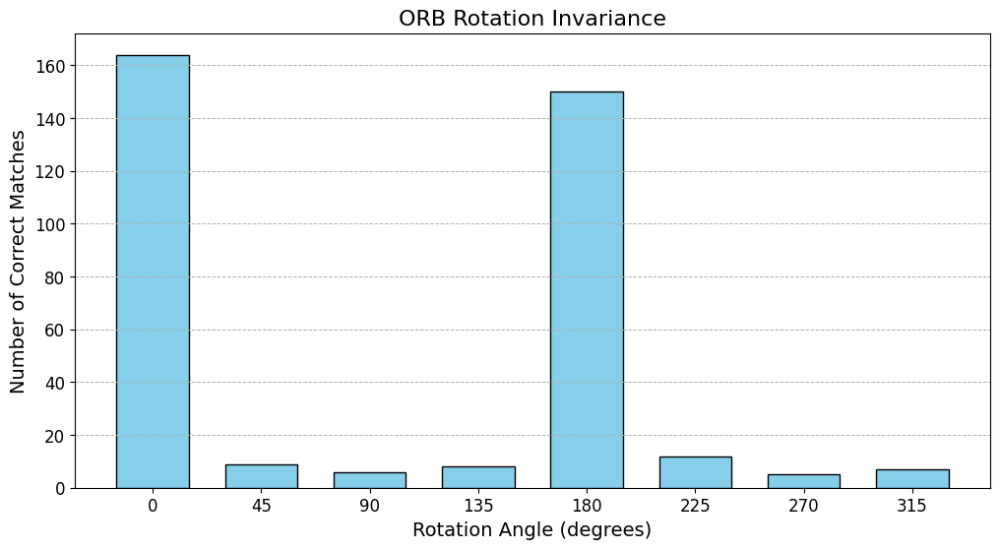

In [154]:
def orbTest(image_path: str, angles: List[float], orb_features: int = 500, th_d: float = 9.0):
    """
    Test ORB's rotation invariance by counting correct matches as a function of rotation angle.

    :param image_path: Path to the input image.
    :param angles: List of angles to rotate the image.
    :param orb_features: Number of ORB features to detect.
    :param th_d: Threshold distance for correct matches.
    :return: correct_matches: List of the number of correct matches for each angle.
    """
    # Read the image
    im = cv2.imread(image_path)
    im_gray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
    
    # Initialize ORB detector
    orb = cv2.ORB_create(nfeatures=orb_features)
    kp1, desc1 = orb.detectAndCompute(im_gray, None)
    
    correct_matches = []
    c0 = np.array([im_gray.shape[1] // 2, im_gray.shape[0] // 2])
    
    for angle in angles:
        # Rotate the image
        M = cv2.getRotationMatrix2D((int(c0[0]), int(c0[1])), angle, 1)
        im_rot = cv2.warpAffine(im, M, (im.shape[1], im.shape[0]))
        im_rot_gray = cv2.cvtColor(im_rot, cv2.COLOR_BGR2GRAY)
        
        # Detect keypoints and compute descriptors for rotated image
        kp2, desc2 = orb.detectAndCompute(im_rot_gray, None)
        
        # Match descriptors
        bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
        matches = bf.match(desc1, desc2)
        matches = sorted(matches, key=lambda x: x.distance)
        
        # Convert OpenCV keypoints and matches to numpy arrays
        locs1, locs2, matches_np = openCV2numpy(kp1, kp2, matches)
        
        # Compute correct matches
        cTheta = c0  # Rotation center stays the same
        correct_match_count = checkRotLocs(locs1, locs2, matches_np, angle, c0, cTheta, th_d)
        correct_matches.append(correct_match_count)
        
        # Debug: visualize matches
        img_matches = cv2.drawMatches(im, kp1, im_rot, kp2, matches[:10], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
        plt.imshow(img_matches)
        plt.title(f'Rotation Angle: {angle}')
        plt.axis('off')
        plt.show()
    
    return correct_matches

# Example usage
angles = range(0, 360, 45)
correct_matches = orbTest('data/model_chickenbroth.jpg', angles)

# Plot the results
plt.figure(figsize=(12, 6))
plt.bar(angles, correct_matches, width=30, color='skyblue', edgecolor='k')
plt.xlabel('Rotation Angle (degrees)', fontsize=14)
plt.ylabel('Number of Correct Matches', fontsize=14)
plt.title('ORB Rotation Invariance', fontsize=16)
plt.xticks(angles, fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle='--', linewidth=0.7)
plt.show()

#### Part 4 - Dry Questions
---

1. Explain the difference between ordinary segmentation and semantic segmentation. State an algorithm that performs standard segmentation and an algorithm that performs semantic segmentation.
2. Steve designed a segmentation algorithm, where the origin of the algorithm is always triangles. When he tried to segment a circle, he got the results below. Calculate the Intersection Over Union (IoU) in each case (it is enough to find an expression with the given parameters). 'o' indicates the center of the circle. The prediction of the algorithm is marked with a dashed line.

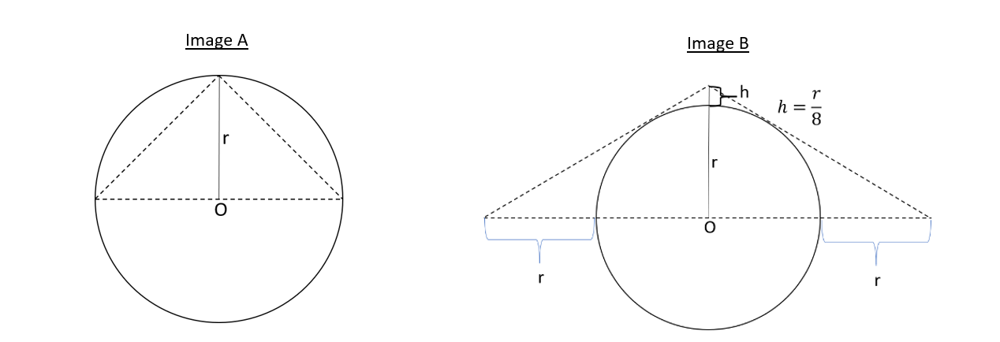



1. Semantic segmentation is segmentation that utilizes an understanding of the objects in the image to classify pixels.  
On the other hand, ordinary segmentation classifies pixels based on geometrical aspects of the image,  
not by first applying real world knowledge, but by calculateing local properties of the image.  
* An algorithm for ordinary segmentation:
* An algorithm for semantic segmentation: 

2. * Image A: $$\text{IoU}(A) = \frac{\text{Area}_{\triangle}}{\text{Area}_{\circ}} = \frac{r^2}{\pi r^2} = \frac{1}{\pi}$$
    * Image B: The are of intersection is the half-cirlce. The area of the union is. TODO COME BACK HERE!

## <img src="https://img.icons8.com/dusk/64/000000/prize.png" style="height:50px;display:inline"> References & Credits
* [1] P. Burt and E. Adelson. The Laplacian Pyramid as a Compact Image Code. IEEE
Transactions on Communications, 31(4):532{540, April 1983.
* [2] David G. Lowe. Distinctive Image Features from Scale-Invariant Keypoints. Inter-
national Journal of Computer Vision, 60(2):91{110, November 2004.
* [3] Michael Calonder, Vincent Lepetit, Christoph Strecha, and Pascal Fua. BRIEF: Binary Robust Independent Elementary Features.
* [4] Rublee, Ethan, Vincent Rabaud, Kurt Konolige, and Gary Bradski. "ORB: An efficient alternative to SIFT or SURF."
* Carnegie Mellon University - CMU
* Icons from <a href="https://icons8.com/">Icon8.com</a> - https://icons8.com
